## Setup

In [ ]:
try:
  import google.colab
  IN_COLAB = True
  print("Running as a Colab notebook")
  from google.colab import drive
  drive.mount('/content/gdrive')
  %cd /content/gdrive/MyDrive/AI-ML-Stuff/Dissertation/work/Transformer-Masking
  %pip install transformer_lens
  %pip install scikit-learn
except:
  IN_COLAB = False
  print("Running as a Jupyter notebook - intended for development only!")

In [ ]:
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.renderers.default = "notebook_connected" # or use "browser" if you want plots to open with browser
import torch as t
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import einops
from fancy_einsum import einsum
from typing import List, Optional, Callable, Tuple, Union
import functools
from tqdm import tqdm
from IPython.display import display
import random
import os
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.utils import shuffle
import json


from transformer_lens.hook_points import HookPoint
from transformer_lens import utils, HookedTransformer, HookedTransformerConfig, FactoredMatrix, ActivationCache

# Saves computation time, since we don't need it for the contents of this notebook
t.set_grad_enabled(False)

## Plotly Setup

In [ ]:
import ipywidgets as wg
from IPython.display import display, HTML
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "last_expr"
# display(HTML("<style>.container { width:70% !important; }</style>"))

import pandas as pd
import numpy as np
import scipy

import sys, os
import time
import datetime
import re

import plotly as py
import plotly.graph_objs as go
import plotly.express as px
from plotly.colors import n_colors
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "colab"


## Load and Run Model

In [ ]:
!nvidia-sli

In [ ]:
gpt2_small = HookedTransformer.from_pretrained("gpt2-small").cuda()

NameError: ignored

In [ ]:
gpt2_small.generate("Repeat the string 'a f q'. a f", max_new_tokens=10, temperature=0, prepend_bos=True)

  0%|          | 0/10 [00:00<?, ?it/s]

"Repeat the string 'a f q'. a f q is a string.\n\nThe following example"

In [ ]:
gpt2_small.generate("1 + 1 =", max_new_tokens=10, temperature=0, prepend_bos=True)

  0%|          | 0/10 [00:00<?, ?it/s]

'1 + 1 = 1 + 1 + 1 + 1 + 1 +'

In [ ]:
gpt2_small.name = "gpt2 small"

In [ ]:
gpt2_text = "Natural language processing tasks, such as question answering, machine translation, reading comprehension, and summarization, are typically approached with supervised learning on taskspecific datasets."
gpt2_text_goose = "Denote simple fat denied add worthy little use. As some he so high down am week. Conduct esteems by cottage to pasture we winding. On assistance he cultivated considered frequently. Person how having tended direct own day man. Saw sufficient indulgence one own you inquietude sympathize."
gpt2_tokens = gpt2_small.to_tokens(gpt2_text_goose)
gpt2_logits, gpt2_cache = gpt2_small.run_with_cache(gpt2_tokens, remove_batch_dim=True)

In [ ]:
gpt2_medium = HookedTransformer.from_pretrained("gpt2-medium").cuda()

Using pad_token, but it is not set yet.


Loaded pretrained model gpt2-medium into HookedTransformer
Moving model to device:  cuda


In [ ]:
gpt2_medium.name = "gpt2 medium"

In [ ]:
gpt2_large = HookedTransformer.from_pretrained("gpt2-large").cuda()
gpt2_large.name = "gpt2 large"

Using pad_token, but it is not set yet.


Loaded pretrained model gpt2-large into HookedTransformer
Moving model to device:  cuda


In [ ]:
gpt2_large.generate("Repeat the phrase 'cat dog goose'. cat dog", max_new_tokens=10, temperature=0, prepend_bos=True)

  0%|          | 0/10 [00:00<?, ?it/s]

"Repeat the phrase 'cat dog goose'. cat dog goose.\n\nThe phrase is a common one"

In [ ]:
gpt2_large.generate("23 + 4 =", max_new_tokens=10, temperature=0, prepend_bos=True)

  0%|          | 0/10 [00:00<?, ?it/s]

'23 + 4 = 21\n\nThe number of people who have been'

In [ ]:
gpt2_xl = HookedTransformer.from_pretrained("gpt2-xl").cuda()
gpt2_xl.name = "gpt2 xl"

Using pad_token, but it is not set yet.


Loaded pretrained model gpt2-xl into HookedTransformer
Moving model to device:  cuda


In [ ]:
gpt2_xl.generate("11 x 10 =", max_new_tokens=10, temperature=0, prepend_bos=True)

  0%|          | 0/10 [00:00<?, ?it/s]

'11 x 10 = 30\n\nThe number of days in a year'

In [ ]:
gpt_neox_20b = HookedTransformer.from_pretrained("gpt-neox-20b").cuda()
gpt_neox_20b.name = "gpt neox 20b"

KeyboardInterrupt: ignored

In [ ]:
gpt_neox_20b.generate("11 x 10 =", max_new_tokens=10, temperature=0, prepend_bos=True)

## Dataset Creation

In [ ]:
# Generate a dataset with all numbers from 0 to 1000

addition_dataset = [str(x) + " + " + str(y) + " =" for x in range(24) for y in range(24)]
odd_addition_dataset = [str(2 * x + 1) + " + " + str(2 * y + 1) + " =" for x in range(24) for y in range(24)]
even_addition_dataset = [str(2 * x) + " + " + str(2 * y) + " =" for x in range(24) for y in range(24)]
multiplication_dataset = [str(x) + " * " + str(y) + " =" for x in range(24) for y in range(24)]
even_multiplication_dataset = [str(2 * x ) + " * " + str(2 * y ) + " =" for x in range(24) for y in range(24)]
odd_multiplication_dataset = [str(2 * x + 1) + " * " + str(2 * y + 1) + " =" for x in range(24) for y in range(24)]
multiplication_dataset2 = [str(x) + " x " + str(y) + " =" for x in range(24) for y in range(24)]

In [ ]:
addition_dataset

['0 + 0 =',
 '0 + 1 =',
 '0 + 2 =',
 '0 + 3 =',
 '0 + 4 =',
 '0 + 5 =',
 '0 + 6 =',
 '0 + 7 =',
 '0 + 8 =',
 '0 + 9 =',
 '0 + 10 =',
 '0 + 11 =',
 '0 + 12 =',
 '0 + 13 =',
 '0 + 14 =',
 '0 + 15 =',
 '0 + 16 =',
 '0 + 17 =',
 '0 + 18 =',
 '0 + 19 =',
 '0 + 20 =',
 '0 + 21 =',
 '0 + 22 =',
 '0 + 23 =',
 '1 + 0 =',
 '1 + 1 =',
 '1 + 2 =',
 '1 + 3 =',
 '1 + 4 =',
 '1 + 5 =',
 '1 + 6 =',
 '1 + 7 =',
 '1 + 8 =',
 '1 + 9 =',
 '1 + 10 =',
 '1 + 11 =',
 '1 + 12 =',
 '1 + 13 =',
 '1 + 14 =',
 '1 + 15 =',
 '1 + 16 =',
 '1 + 17 =',
 '1 + 18 =',
 '1 + 19 =',
 '1 + 20 =',
 '1 + 21 =',
 '1 + 22 =',
 '1 + 23 =',
 '2 + 0 =',
 '2 + 1 =',
 '2 + 2 =',
 '2 + 3 =',
 '2 + 4 =',
 '2 + 5 =',
 '2 + 6 =',
 '2 + 7 =',
 '2 + 8 =',
 '2 + 9 =',
 '2 + 10 =',
 '2 + 11 =',
 '2 + 12 =',
 '2 + 13 =',
 '2 + 14 =',
 '2 + 15 =',
 '2 + 16 =',
 '2 + 17 =',
 '2 + 18 =',
 '2 + 19 =',
 '2 + 20 =',
 '2 + 21 =',
 '2 + 22 =',
 '2 + 23 =',
 '3 + 0 =',
 '3 + 1 =',
 '3 + 2 =',
 '3 + 3 =',
 '3 + 4 =',
 '3 + 5 =',
 '3 + 6 =',
 '3 + 7 ='

In [ ]:
random.shuffle(addition_dataset)
random.shuffle(multiplication_dataset)
combined_add_mult_dataset = addition_dataset + multiplication_dataset
random.shuffle(combined_add_mult_dataset)

In [ ]:
combined_add_mult_dataset = combined_add_mult_dataset[:24**2]

In [ ]:
def generate_random_addition_dataset(sqrt_n):
  # Generate some random tokens
  n = sqrt_n ** 2

  # Randomly sample 25 tokens
  random_token_choice = random.sample(list(range(50256)), sqrt_n)

  # Get the token for " +" (this is token 1343)
  add_token = 1343
  equal_token = 796
  EOS_token = 50256

  # Create the addition dataset using these random tokens
  random_token_addition_list = [t.Tensor([[EOS_token, a, add_token, b, equal_token]]) for a in random_token_choice for b in random_token_choice]

  dataset_tensor = t.cat(random_token_addition_list, dim=0)

  dataset_tensor = dataset_tensor.int()

  return dataset_tensor

In [ ]:
random_token_addition_dataset = generate_random_addition_dataset(24)

In [ ]:
random_token_addition_dataset.dtype

torch.int32

In [ ]:
# Shuffle the addition and multiplication datasets
def shuffle_string(s):
    # Split the string based on whitespace
    chars = s.split()

    # Shuffle the characters
    random.shuffle(chars)

    # Reintroduce whitespace between each character
    shuffled = ' '.join(chars)

    return shuffled

shuffled_addition_dataset = [shuffle_string(s) for s in addition_dataset]

In [ ]:
# Think the above leads to some tokenisation issues: just choose the tokens directly
shuffled_addition_dataset

['+ = 20 12',
 '0 + 10 =',
 '= + 5 11',
 '= 2 + 13',
 '12 + 11 =',
 '12 = 14 +',
 '= + 20 10',
 '8 6 + =',
 '+ = 10 11',
 '+ 14 3 =',
 '= 14 0 +',
 '+ 2 = 19',
 '+ 12 6 =',
 '20 17 = +',
 '= + 6 19',
 '= + 0 3',
 '17 2 = +',
 '22 = 20 +',
 '22 = 0 +',
 '+ = 8 12',
 '7 = 4 +',
 '17 = + 19',
 '10 = 21 +',
 '= 19 + 20',
 '= 12 13 +',
 '15 + = 5',
 '= 7 + 3',
 '12 1 = +',
 '+ 6 = 17',
 '+ 5 = 23',
 '8 = 3 +',
 '7 17 + =',
 '+ 13 16 =',
 '= + 13 10',
 '13 11 = +',
 '= 2 2 +',
 '= + 8 1',
 '22 + 19 =',
 '= + 21 10',
 '+ 5 4 =',
 '13 = 2 +',
 '+ = 0 12',
 '+ 16 9 =',
 '5 + 16 =',
 '= 19 + 15',
 '1 16 + =',
 '= 17 + 0',
 '= 10 6 +',
 '6 14 = +',
 '7 17 = +',
 '21 + = 1',
 '21 + 5 =',
 '= + 20 22',
 '8 1 = +',
 '+ = 10 6',
 '22 = + 11',
 '= 23 17 +',
 '14 = 9 +',
 '16 + = 23',
 '+ 23 23 =',
 '+ 10 = 17',
 '= + 5 14',
 '2 + 10 =',
 '= 3 13 +',
 '10 3 + =',
 '+ 1 20 =',
 '17 16 + =',
 '12 = + 9',
 '8 = 13 +',
 '10 = 17 +',
 '+ = 3 21',
 '= 19 1 +',
 '3 19 = +',
 '+ 15 8 =',
 '16 + 22 =',
 '+ = 12

In [ ]:
# Generate some random tokens
n = 24 ** 2

random_tokens = t.randint(low=1, high=50256, size=(n, 5))

# replace the first column with 50256
random_tokens[:, 0] = 50256

Todo: look at sampling from the tokeniser

Note that Gpt 3.5 has a larger tokeniser

In [ ]:
random_tokens.shape

torch.Size([576, 5])

In [ ]:
# Create the baseline dataset

def read_all_text_files(directory):
    # List to hold the contents of all files
    contents_list = []

    # List all files in directory
    for filename in os.listdir(directory):
        # Check if file is a text file
        if filename.endswith('.txt'):
            # Construct full file path
            filepath = os.path.join(directory, filename)

            # Open the file and read the contents
            with open(filepath, 'r') as f:
                contents = f.read()

            # Add the file contents to the list
            contents_list.append(contents)

    return contents_list

training_subset = {}
training_subset['urlsf_subset01-1_data'] = read_all_text_files('urlsf_subset01-1_data')
training_subset['urlsf_subset01-182_data'] = read_all_text_files('urlsf_subset01-182_data')

In [ ]:
training_subset_tokens = {}
token_list = [gpt2_small.to_tokens(s)[:,:5] for s in training_subset['urlsf_subset01-1_data']]
token_list += [gpt2_small.to_tokens(s)[:,:5] for s in training_subset['urlsf_subset01-182_data']]
training_subset_tokens = t.cat(token_list, dim=0)

### Repetition Datasets

In [ ]:
repetition_dataset_a = [f"Repeat the string '{chr(ord('a') + x)} {chr(ord('a') + y)} a'. {chr(ord('a') + x)} {chr(ord('a') + y)}" for x in range(26) for y in range(26)]

In [ ]:
repetition_dataset_f = [f"Repeat the string '{chr(ord('a') + x)} {chr(ord('a') + y)} f'. {chr(ord('a') + x)} {chr(ord('a') + y)}" for x in range(26) for y in range(26)]
repetition_dataset_u = [f"Repeat the string '{chr(ord('a') + x)} {chr(ord('a') + y)} u'. {chr(ord('a') + x)} {chr(ord('a') + y)}" for x in range(26) for y in range(26)]
repetition_dataset_q = [f"Repeat the string '{chr(ord('a') + x)} {chr(ord('a') + y)} q'. {chr(ord('a') + x)} {chr(ord('a') + y)}" for x in range(26) for y in range(26)]
repetition_dataset_w = [f"Repeat the string '{chr(ord('a') + x)} {chr(ord('a') + y)} w'. {chr(ord('a') + x)} {chr(ord('a') + y)}" for x in range(26) for y in range(26)]

In [ ]:
repetition_datasets = {
    "repeat a": repetition_dataset_a,
    "repeat f": repetition_dataset_f,
    "repeat u": repetition_dataset_u,
    "repeat q": repetition_dataset_q,
    "repeat w": repetition_dataset_w
}

In [ ]:
s = training_subset['urlsf_subset01-1_data'][0]
gpt2_large.to_tokens(s)[:,:5].shape

torch.Size([1, 5])

In [ ]:
training_subset_tokens.shape

torch.Size([599, 5])

In [ ]:
training_subset_tokens = training_subset_tokens[:n**2, :]

In [ ]:
[len(training_subset[key]) for key in training_subset]

[169, 430]

In [ ]:
xs = [lst for lst in training_subset]

In [ ]:
xs

['urlsf_subset01-1_data', 'urlsf_subset01-182_data']

### Causal Family Datasets

In [ ]:
import json


In [ ]:
family_datasets = {}

In [ ]:
# Specify the file path
file_path = 'family_dataset1.json'

# Open and read the JSON file
with open(file_path, 'r') as file:
  # Load the JSON data from the file
  dataset1 = json.load(file)

  family_datasets["same name"] = dataset1

In [ ]:
# Specify the file path
file_path = 'family_dataset2.json'

# Open and read the JSON file
with open(file_path, 'r') as file:
  # Load the JSON data from the file
  dataset2 = json.load(file)
  family_datasets["same relation"] = dataset2

In [ ]:
# Specify the file path
file_path = 'family_dataset3.json'

family_datasets = {}

# Open and read the JSON file
with open(file_path, 'r') as file:
  # Load the JSON data from the file
  dataset3 = json.load(file)

  family_datasets["same name and relation"] = dataset3

## Datasets with potentially variable length

## Functions

In [ ]:
def SVD(matrix: t.Tensor) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
  """
  Compute the SVD of a matrix.
  Returns the three associated matrices
  """
  U, S, V_H = t.linalg.svd(matrix)
  return U, S, V_H


In [ ]:
# Run a dataset through the model, store all the activations
def dataset_activations(
  model: HookedTransformer,
  dataset: List[str]
):
  # TODO: make this run in batches instead of at once.
  #
  # Tokenise the batch, form a batch tensor
  batch_tokens = model.to_tokens(dataset)
  # Feed the tensor through the model
  logits, cache = model.run_with_cache(batch_tokens, return_cache_object=True, remove_batch_dim=False)

  return logits, cache

In [ ]:
# Reshape into a matrix (looks at activations of each token)

def reshape_activations(
  batch_activations: t.Tensor
) -> t.Tensor:
  squeezed_tensor = einops.rearrange(batch_activations, 'b tokens dim -> (b tokens) dim')
  return squeezed_tensor



In [ ]:
def activation_SVD(
    model: HookedTransformer,
    dataset: List[str],
    location: str
) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
  _, cache = dataset_activations(model, dataset)
  activation_cache = cache[location]
  squeezed_activations = reshape_activations(activation_cache)
  U, S, V_H = SVD(squeezed_activations)
  return U, S, V_H


In [ ]:
# Run a dataset through the model, store all the activations
def dataset_activations_tokens(
  model: HookedTransformer,
  dataset_tokens: t.Tensor
):
  # Tokenise the batch, form a batch tensor
  batch_tokens = dataset_tokens
  # Feed the tensor through the model
  logits, cache = model.run_with_cache(batch_tokens, return_cache_object=True, remove_batch_dim=False)
  return logits, cache

def reshape_activations(
  batch_activations: t.Tensor
) -> t.Tensor:
  squeezed_tensor = einops.rearrange(batch_activations, 'b tokens dim -> (b tokens) dim')
  return squeezed_tensor

def activation_SVD_tokens(
    model: HookedTransformer,
    dataset_tokens: List[str],
    location: str
) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
  _, cache = dataset_activations_tokens(model, dataset_tokens)
  activation_cache = cache[location]
  squeezed_activations = reshape_activations(activation_cache)
  U, S, V_H = SVD(squeezed_activations)
  return U, S, V_H

In [ ]:
def activation_SVD_covariance(
    model: HookedTransformer,
    dataset_tokens: List[str],
    location: str
) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
  """
  Similar to normal covariance, but we look at the normalised covariance matrix instead.
  """
  _, cache = dataset_activations_tokens(model, dataset_tokens)
  activation_cache = cache[location]
  squeezed_activations = reshape_activations(activation_cache)
  print(squeezed_activations.shape)
  mean_activation = squeezed_activations.mean(dim=0, keepdim=True)
  centred_activations = squeezed_activations - mean_activation
  covariance_matrix = centred_activations.T @ centred_activations
  print(covariance_matrix.shape)
  U, S, V_H = SVD(covariance_matrix)
  return U, S, V_H


# activation_SVD_covariance(gpt2_small, multiplication_dataset, 'blocks.5.hook_attn_out')



In [ ]:
# Using tokens as a starting point, and also using the covariance matrix
def activation_SVD_tokens_covariance(
    model: HookedTransformer,
    dataset_tokens: List[str],
    location: str
) -> Tuple[t.Tensor, t.Tensor, t.Tensor]:
  _, cache = dataset_activations_tokens(model, dataset_tokens)
  activation_cache = cache[location]
  squeezed_activations = reshape_activations(activation_cache)
  mean_activation = squeezed_activations.mean(dim=0, keepdim=True)
  centred_activations = squeezed_activations - mean_activation
  covariance_matrix = centred_activations.T @ centred_activations
  U, S, V_H = SVD(covariance_matrix)
  return U, S, V_H

In [ ]:
def attention_head_output(
    model: HookedTransformer,


) -> t.Tensor:
  """
  Mimic the activations that should be implemented by TransformerLens.
  Returns:
    activations: t.Tensor. Shape [batch, pos, head_index, d_model]
  """




## Singular Vector Subspace Comparison

For a bit of context: we want to be able to compare the subspaces we get from doing PCA on different sub-spaces.

One way of doing this is by comparing the approximation error for different datasets.

## Plotly Playing around


In [ ]:
# Generating data
x = np.linspace(0, 2 * np.pi, 100)  # x array
lines = 50  # number of lines (frames)
pio.renderers.default = 'notebook_connected'  # Update default renderer

# Creating figure
fig = go.Figure(
    data=[go.Scatter(x=x, y=np.sin(x), mode="lines", line=dict(width=2))],
    layout=go.Layout(
        xaxis=dict(range=[0, 2 * np.pi], autorange=False),
        yaxis=dict(range=[-1, 1], autorange=False),
        title="Start Title",
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None])])]),
    frames=[go.Frame(
        data=[go.Scatter(
            x=x,
            y=np.sin(x + ((np.pi / lines) * i)),
            mode="lines",
            line=dict(width=2))])
        for i in range(lines)]
)

fig.show(renderer="colab")

In [ ]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Scatter(y=[4, 2, 1], mode="lines"), row=1, col=1)
fig.add_trace(go.Bar(y=[2, 1, 3]), row=1, col=2)

fig.show(renderer="colab")

In [ ]:
w = wg.FloatSlider(
    value = 7.5,
    min = .0,
    max = 100.0,
    step = .2,
    description = "Slider: ",
    orientation = "horizontal",
    readout_format = ".2f"
)

display(w)

FloatSlider(value=7.5, description='Slider: ', step=0.2)

In [ ]:
fig = go.FigureWidget(
    layout=go.Layout(
        title_text="y = sin(ax - b)",
        width=500,
        height=300,
        margin=dict(l=20,r=20,t=50,b=20)
    )
)
scatt = fig.add_scatter()

xs=np.linspace(0, 6, 100)

@wg.interact(a=(1.0, 4.0, 0.05), b=(0, 10.0, 0.05), color=['red', 'green', 'blue'])
def update(a=3.6, b=4.3, color='blue'):
    ys = np.sin(a*xs - b)
    with fig.batch_update():
        fig.data[0].x = xs
        fig.data[0].y = ys
        fig.data[0].line.color = color
    fig.show(renderer="colab")

interactive(children=(FloatSlider(value=3.6, description='a', max=4.0, min=1.0, step=0.05), FloatSlider(value=…

## Playing around

In [ ]:
type(gpt2_small)

transformer_lens.HookedTransformer.HookedTransformer

In [ ]:
listo = ["1 + 1 =", "2 + 2 =", "4 + 5 ="]
gpt2_small.to_tokens(listo)

tensor([[50256,    16,  1343,   352,   796],
        [50256,    17,  1343,   362,   796],
        [50256,    19,  1343,   642,   796]], device='cuda:0')

In [ ]:
logits, cache = dataset_activations(gpt2_small, listo)

In [ ]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out', 'blocks.1.hook_resid_post', 'blocks.2.hook_re

In [ ]:
cache['blocks.1.attn.hook_v'].shape

torch.Size([3, 5, 12, 64])

In [ ]:
gpt2_small

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (pos_embed): PosEmbed()
  (hook_pos_embed): HookPoint()
  (blocks): ModuleList(
    (0-11): 12 x TransformerBlock(
      (ln1): LayerNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): LayerNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
      )
      (mlp): MLP(
        (hook_pre): HookPoint()
        (hook_post): HookPoint()
      )
      (hook_q_input): HookPoint()
      (hook_k_input): HookPoint()
      (hook_v_input): HookPoint()
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (hook_resid_pre): HookPoint()
      (hook_resid_mid): HookPoint()
   

In [ ]:
#def split_attn_head_output(model, attn):


In [ ]:
cache['blocks.1.hook_attn_out']

tensor([[[ 3.0030e-01,  6.3845e-02,  1.9236e-01,  ..., -2.9436e-02,
          -2.2819e-01,  1.6854e-01],
         [ 8.1541e-01,  2.5803e-01,  8.9154e-02,  ...,  1.6319e-01,
          -2.9132e-01, -3.8416e-02],
         [ 4.6359e-01,  7.6719e-02, -5.0320e-02,  ...,  4.8573e-01,
          -2.7379e-01, -3.9466e-02],
         [ 7.1101e-01, -3.4359e-02, -1.5091e-01,  ...,  4.1520e-01,
          -9.1804e-02, -2.7625e-01],
         [ 5.2284e-01,  1.5382e-02, -7.9406e-02,  ...,  4.5765e-01,
          -2.9163e-01, -1.8328e-01]],

        [[ 3.0030e-01,  6.3845e-02,  1.9236e-01,  ..., -2.9436e-02,
          -2.2819e-01,  1.6854e-01],
         [ 8.0613e-01,  1.8654e-01,  7.8691e-02,  ...,  1.2346e-01,
          -3.1740e-01,  2.2635e-02],
         [ 4.9568e-01,  1.3080e-01, -2.5302e-02,  ...,  3.9476e-01,
          -3.3249e-01, -7.1359e-04],
         [ 7.7822e-01,  9.6960e-02, -1.1637e-01,  ...,  2.7919e-01,
          -2.3328e-01, -1.4165e-01],
         [ 6.0475e-01,  1.1738e-01, -7.1964e-02,  ...

In [ ]:
cache['blocks.1.attn.hook_z']

tensor([[[[ 2.8708e-01,  1.6204e-01,  2.2307e-02,  ...,  9.7654e-02,
           -3.6841e-01, -1.5214e-01],
          [ 2.0819e-01,  2.6564e-02,  3.9419e-02,  ..., -1.4340e-01,
           -1.7574e-01, -1.0403e-01],
          [ 3.1279e-01, -1.5799e-01, -3.4992e-02,  ..., -2.6322e-01,
            7.7657e-02, -3.7649e-01],
          ...,
          [ 1.4474e-01,  3.6899e-01,  1.6935e-01,  ..., -4.0529e-01,
           -9.0198e-01, -2.2870e-01],
          [ 3.3732e-01,  1.3987e-01,  3.9456e-01,  ...,  3.0202e-01,
           -2.9103e+00, -2.6581e-01],
          [ 2.4160e-01, -2.3519e-01,  8.6298e-02,  ..., -6.5473e-01,
           -1.5789e-02, -1.6673e-01]],

         [[ 2.7838e-01,  1.6119e-01,  3.6033e-03,  ...,  9.6280e-02,
           -3.5989e-01, -1.4950e-01],
          [ 1.8333e-01,  3.7838e-02,  2.7976e-02,  ..., -1.2497e-01,
           -1.7831e-01, -9.2200e-02],
          [ 3.1961e-01, -1.5780e-01, -3.5600e-02,  ..., -2.6433e-01,
            7.9607e-02, -3.6545e-01],
          ...,
     

In [ ]:
squeezed_activations = reshape_activations(cache['blocks.1.mlp.hook_post'])

In [ ]:
squeezed_activations.shape

torch.Size([15, 3072])

In [ ]:
_, S, _ = SVD(squeezed_activations)

In [ ]:
S

tensor([4.6558e+01, 2.3108e+01, 1.3393e+01, 1.1233e+01, 7.4737e+00, 5.0774e+00,
        4.2678e+00, 2.4823e+00, 1.1972e+00, 1.0829e+00, 6.6698e-01, 4.8446e-01,
        2.9346e-01, 1.1848e-06, 3.2508e-11], device='cuda:0')

In [ ]:
S = activation_SVD(gpt2_small, listo, 'blocks.1.mlp.hook_post')

In [ ]:
S

(tensor([[ 5.7676e-01,  6.8909e-03,  1.8794e-02,  7.2643e-03, -1.5052e-02,
           8.5117e-04, -3.9263e-04, -7.7116e-04,  1.0182e-04,  1.2152e-04,
           9.6808e-05, -7.5965e-04, -1.0467e-04, -8.1385e-01,  6.5703e-02],
         [-2.1425e-02,  2.8424e-01,  3.4373e-01, -1.1515e-01, -2.6892e-01,
           4.6235e-01, -2.7341e-01, -4.0150e-01, -4.6728e-01, -2.0184e-01,
          -7.8690e-02,  4.4487e-03,  1.7793e-03,  1.8756e-09, -5.1770e-09],
         [-5.7051e-03,  3.1918e-01, -1.0352e-01,  4.6203e-01,  4.8993e-02,
           2.1522e-02,  9.8841e-04,  3.8121e-03,  1.2292e-01, -1.6332e-01,
          -3.8862e-01, -5.2753e-01, -4.4713e-01, -7.4599e-08,  1.0732e-08],
         [ 3.8603e-03,  2.4700e-01,  2.0451e-01, -1.8982e-01,  4.5049e-01,
           6.1848e-01, -4.9214e-02,  2.9224e-01,  3.9123e-01,  1.7291e-01,
           6.9707e-02,  5.6892e-04, -2.5665e-03, -5.3455e-09, -4.8243e-10],
         [ 1.1943e-02,  2.9737e-01, -4.0555e-01, -2.8987e-01, -7.4079e-02,
          -8.4946e-03

In [ ]:
t.cuda.empty_cache()

In [ ]:
S = activation_SVD(gpt2_small, addition_dataset, 'blocks.1.mlp.hook_post')

In [ ]:
S.shape

AttributeError: ignored

In [ ]:
gpt2_small.to_tokens("40 + 41 =")

In [ ]:
random_tokens.shape

In [ ]:
random_activation_S = activation_SVD_tokens(gpt2_small, random_tokens, 'blocks.1.mlp.hook_post')
#Note: the MLP layer has 4 * the dimension of the residual stream! Makes sense: 3072 / 4 = 768 :))

## Activation Experiments

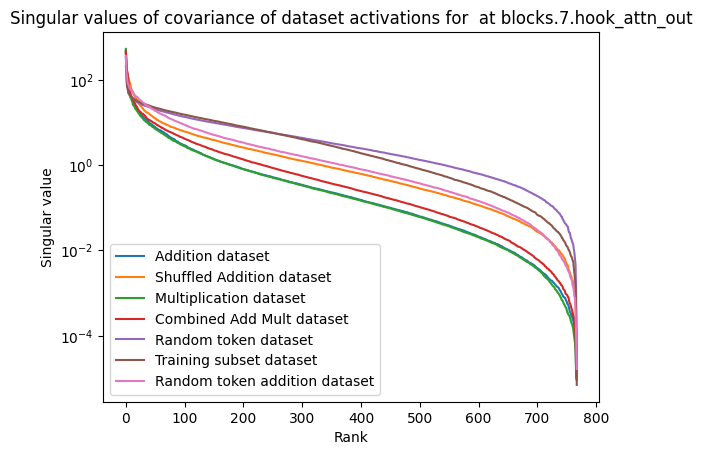

In [ ]:
def experiment(location, model):
  _, S, _ = activation_SVD(model, addition_dataset, location)
  _, S_shuffled, _ = activation_SVD(model, shuffled_addition_dataset, location)
  _, S_prime, _ = activation_SVD(model, multiplication_dataset, location)
  _, S_add_mult, _ = activation_SVD(model, combined_add_mult_dataset, location)
  _, random_activation_S, _ = activation_SVD_tokens(model, random_tokens, location)
  _, S_training, _ = activation_SVD_tokens(model, training_subset_tokens, location)
  _, S_random_addition, _ = activation_SVD_tokens(model, random_token_addition_dataset, location)


  # Plotting
  plt.plot(S.cpu(), label='Addition dataset')
  plt.plot(S_shuffled.cpu(), label='Shuffled Addition dataset')
  plt.plot(S_prime.cpu(), label='Multiplication dataset')
  plt.plot(S_add_mult.cpu(), label='Combined Add Mult dataset')
  plt.plot(random_activation_S.cpu(), label='Random token dataset')
  plt.plot(S_training.cpu(), label='Training subset dataset')
  plt.plot(S_random_addition.cpu(), label="Random token addition dataset")


  # Add labels and title
  plt.title(f'Singular values of covariance of dataset activations for {model.name} at {location}')
  plt.yscale('log')
  plt.ylabel("Singular value")
  plt.xlabel("Rank")

  # Add legend
  plt.legend()

  # Display the plot
  plt.show()

experiment('blocks.7.hook_attn_out', gpt2_small)

In [ ]:
gpt2_large.blocks

ModuleList(
  (0-35): 36 x TransformerBlock(
    (ln1): LayerNormPre(
      (hook_scale): HookPoint()
      (hook_normalized): HookPoint()
    )
    (ln2): LayerNormPre(
      (hook_scale): HookPoint()
      (hook_normalized): HookPoint()
    )
    (attn): Attention(
      (hook_k): HookPoint()
      (hook_q): HookPoint()
      (hook_v): HookPoint()
      (hook_z): HookPoint()
      (hook_attn_scores): HookPoint()
      (hook_pattern): HookPoint()
      (hook_result): HookPoint()
    )
    (mlp): MLP(
      (hook_pre): HookPoint()
      (hook_post): HookPoint()
    )
    (hook_q_input): HookPoint()
    (hook_k_input): HookPoint()
    (hook_v_input): HookPoint()
    (hook_attn_out): HookPoint()
    (hook_mlp_out): HookPoint()
    (hook_resid_pre): HookPoint()
    (hook_resid_mid): HookPoint()
    (hook_resid_post): HookPoint()
  )
)

In [ ]:
24 * 24 * 5

2880

In [ ]:
random_token_addition_dataset

torch.Size([2880, 1280])
torch.Size([1280, 1280])
torch.Size([2880, 1280])
torch.Size([1280, 1280])
torch.Size([2880, 1280])
torch.Size([1280, 1280])
torch.Size([2880, 1280])
torch.Size([1280, 1280])


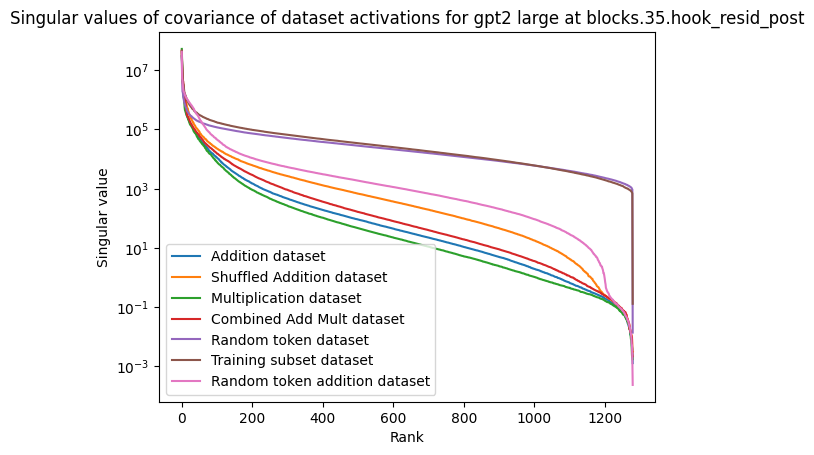

In [ ]:
def covariance_experiment(location, model):
  _, S, _ = activation_SVD_covariance(model, addition_dataset, location)
  _, S_shuffled, _ = activation_SVD_covariance(model, shuffled_addition_dataset, location)
  _, S_prime, _ = activation_SVD_covariance(model, multiplication_dataset, location)
  _, S_add_mult, _ = activation_SVD_covariance(model, combined_add_mult_dataset, location)
  _, random_activation_S, _ = activation_SVD_tokens_covariance(model, random_tokens, location)
  _, S_training, _ = activation_SVD_tokens_covariance(model, training_subset_tokens, location)
  _, S_random_addition, _ = activation_SVD_tokens_covariance(model, random_token_addition_dataset, location)

  # Plotting
  plt.plot(S.cpu(), label='Addition dataset')
  plt.plot(S_shuffled.cpu(), label='Shuffled Addition dataset')
  plt.plot(S_prime.cpu(), label='Multiplication dataset')
  plt.plot(S_add_mult.cpu(), label='Combined Add Mult dataset')
  plt.plot(random_activation_S.cpu(), label='Random token dataset')
  plt.plot(S_training.cpu(), label='Training subset dataset')
  plt.plot(S_random_addition.cpu(), label="Random token addition dataset")



  # Add labels and title
  plt.title(f'Singular values of covariance of dataset activations for {model.name} at {location}')
  plt.yscale('log')
  plt.ylabel("Singular value")
  plt.xlabel("Rank")

  # Add legend
  plt.legend()

  # Display the plot
  plt.show()

covariance_experiment('blocks.35.hook_resid_post', gpt2_large)

Marginally, earlier layers of hook mlp out seem to have a more uniform distribution of singular values for the random token dataset compared to the training subset dataset. In later layers, this maybe changes so that the singular value distribution from the training distribution becomes more uniform.

In [ ]:
cache

In [ ]:
shuffled_addition_dataset[0:10]

## Singular Vector Supbspace Comparison

In [ ]:
U, S, V_H = activation_SVD_covariance(gpt2_small, addition_dataset, 'blocks.10.hook_attn_out')

torch.Size([2880, 768])
torch.Size([768, 768])


In [ ]:
U.shape

torch.Size([768, 768])

In [ ]:
S.shape

torch.Size([768])

In [ ]:
V_H.shape

torch.Size([768, 768])

In [ ]:
U, S, V_H = activation_SVD(gpt2_small, addition_dataset, 'blocks.10.hook_attn_out')

In [ ]:
U.shape

torch.Size([2880, 2880])

In [ ]:
S.shape

torch.Size([768])

In [ ]:
V_H.shape

torch.Size([768, 768])

Now, I'm pretty confident that the rows of V_H are the vectors we care about!

The methodology will now be to:

1. Make a function which projects arbitrary functions to some basis vectors. (PCA!)
2. Make another function which measures the error of a projection. (Error of PCA!)
3. Do this successively for the error of each projection. (Like iterative PCA or something like that!)

To do the projection, I think we can just do something like truncate our matrix, and do a straightforward matrix multiplication.

I think this looks like:
1. Take V_T. Truncate the bottom vectors to get dims of D x M. Call this B_T (I think).
2. Then do B @ B_T @ X_T . The dims here are (D x M) . (M x D) . (D x N) = (D x N)
3. The resulting matrix is our projected dataset I think! Could then just take this away from the original matrix, sum the L_2 norm on each of these rows.

In [ ]:
def dataset_projection(
    X: t.Tensor,
    B: t.Tensor
) -> t.Tensor:
  """
  Take in dataset X (with datapoints as rows) and an orthogonal basis B of a subspace.

  The basis should be of dimension D x M, with M vectors in the basis each of dim D.

  Compute the projection of each datapoint on this subspace, store the results as
  another dataset in the same form as the original.
  """

  return B.T @ B @ X.T


In [ ]:
def top_k_projection(
    X: t.Tensor,
    V_H: t.Tensor,
    k: int
) -> t.Tensor:
  """
  Project the dataset X onto the top k orthogonal basis vectors in V_H
  """
  B = V_H[:k,:]
  proj = dataset_projection(X, B)
  return proj.T

In [ ]:
def matrix_error(
    X_1: t.Tensor,
    X_2: t.Tensor
) -> int:
  """
  Treat X_1 and X_2 as rows of datapoints.
  Then, take the difference between these matrices,
  compute the l_2 norm of each row,
  and then sum these norms.

  Return the sum of these norms.
  """
  X = X_1 - X_2
  norms = t.norm(X, dim=1, p=2)
  sum_of_norms = t.sum(norms)

  return sum_of_norms


In [ ]:
X_approx = top_k_projection(X, V_H, 500)

NameError: ignored

In [ ]:
X_approx.shape

torch.Size([2880, 768])

In [ ]:
error = matrix_error(X_approx, X)

In [ ]:
error

tensor(35.0489, device='cuda:0')

In [ ]:
def approximation_error_experiment(location, target_datasets_lang, target_datasets_tokens, comparison_datasets_lang, comparison_datasets_tokens, n = None):
  """
  target dataset: the dataset we will use to generate subspaces to project onto
  comparison dataset lang: the dataset we will project onto the subspaces, where the dataset is text

  n: number of points we want to use
  """
  # Get the activations for each dataset
  if target_datasets_lang != None:
    target_name = [key for key in target_datasets_lang][0]
    target_dataset_lang = target_datasets_lang[target_name]
    target_activations = dataset_activations(gpt2_small, target_dataset_lang)[1][location]
    target_X = reshape_activations(target_activations)
    # Do SVD for target_X
    _, _, V_H = activation_SVD(gpt2_small, target_dataset_lang, location)

  else:
    target_name = [key for key in target_datasets_tokens][0]
    target_dataset_tokens = target_datasets_tokens[target_name]
    target_activations = dataset_activations_tokens(gpt2_small, target_dataset_tokens)[1][location]
    target_X = reshape_activations(target_activations)
    # Do SVD for target_X
    _, _, V_H = activation_SVD_tokens(gpt2_small, target_dataset_tokens, location)


  comparison_X_dict = {}
  for key in comparison_datasets_lang:
    comparison_dataset = comparison_datasets_lang[key]
    comparison_activations = dataset_activations(gpt2_small, comparison_dataset)[1][location]
    comparison_X = reshape_activations(comparison_activations)
    # Normalise rows of the comparison activations (to avoid penalising large vectors)
    norms = t.linalg.norm(comparison_X, dim=1, keepdim=True)
    comparison_X = comparison_X / norms

    comparison_X_dict[key] = comparison_X


  for key in comparison_datasets_tokens:
    comparison_dataset = comparison_datasets_tokens[key]
    comparison_activations = dataset_activations_tokens(gpt2_small, comparison_dataset)[1][location]
    comparison_X = reshape_activations(comparison_activations)
    # Normalise rows of the comparison activations (to avoid penalising large vectors)
    norms = t.linalg.norm(comparison_X, dim=1, keepdim=True)
    comparison_X = comparison_X / norms

    comparison_X_dict[key] = comparison_X




  dim = comparison_X.shape[1]
  if n is None:
    n = dim

  # Form approximations for each dataset
  comp_errors_list = []
  for key in comparison_X_dict:
    comparison_X = comparison_X_dict[key]
    comp_errors = []
    target_errors = []
    for i in range(n):
      k = (i * dim) // n
      # Get errors for the comparison dataset
      approx_comparison_X = top_k_projection(comparison_X, V_H, k)
      comp_errors.append(matrix_error(approx_comparison_X, comparison_X).cpu())

      # Get errors for the target dataset
      approx_target_X = top_k_projection(target_X, V_H, k)
      target_errors.append(matrix_error(approx_target_X, target_X).cpu())

    comp_errors_list.append(comp_errors)
    plt.plot(comp_errors, label = key)

  # plt.yscale("log")
  plt.ylabel("Reconstruction error")
  plt.xlabel("Subspace dimension")
  plt.title(f"Dataset Reconstruction Errors at {location}. Target dataset {target_name} ")
  plt.legend()
  plt.show()

  return comp_errors_list


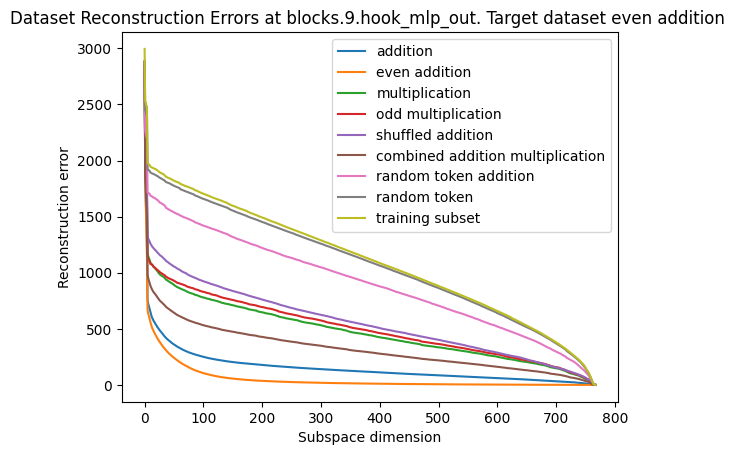

In [ ]:
datasets_lang = {
    "addition": addition_dataset,
    "even addition": even_addition_dataset,
    "multiplication": multiplication_dataset,
    "odd multiplication": odd_multiplication_dataset,
    "shuffled addition": shuffled_addition_dataset,
    "combined addition multiplication": combined_add_mult_dataset
}

datasets_tokens = {
    "random token addition": random_token_addition_dataset,
    "random token": random_tokens,
    "training subset": training_subset_tokens
}

add_errors = approximation_error_experiment('blocks.9.hook_mlp_out', {"even addition":even_addition_dataset}, None, datasets_lang, datasets_tokens)


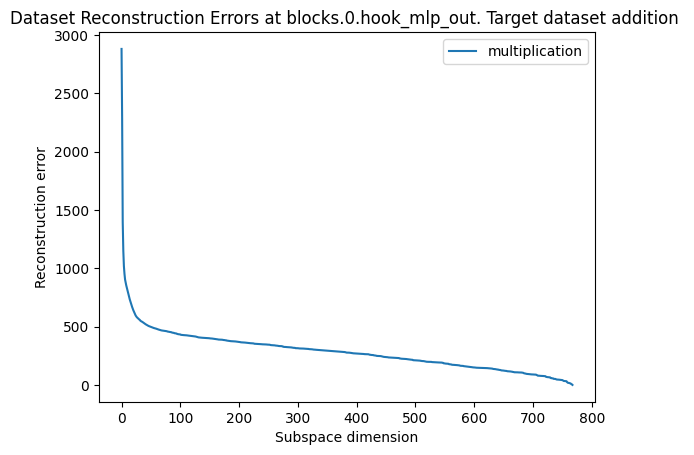

In [ ]:
add_errors = approximation_error_experiment('blocks.0.hook_mlp_out', {"addition":addition_dataset}, None, {"multiplication": multiplication_dataset}, {})


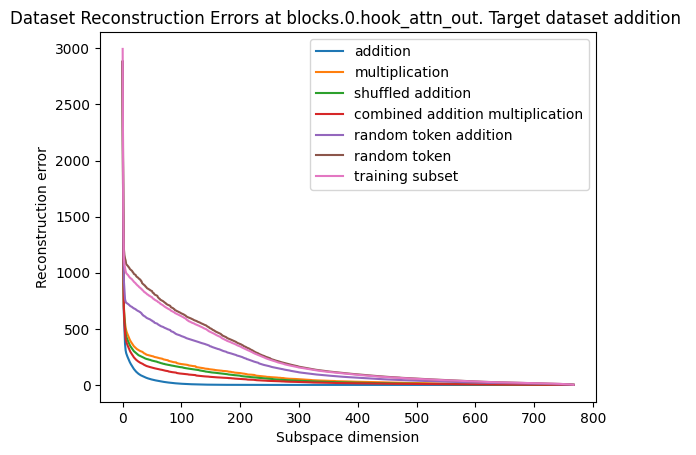

In [ ]:
add_errors = approximation_error_experiment('blocks.0.hook_attn_out', {"addition":addition_dataset}, None, datasets_lang, datasets_tokens)


In [ ]:
add_errors = approximation_error_experiment('blocks.9.hook_attn_out', {"addition":addition_dataset}, None, datasets_lang, datasets_tokens)


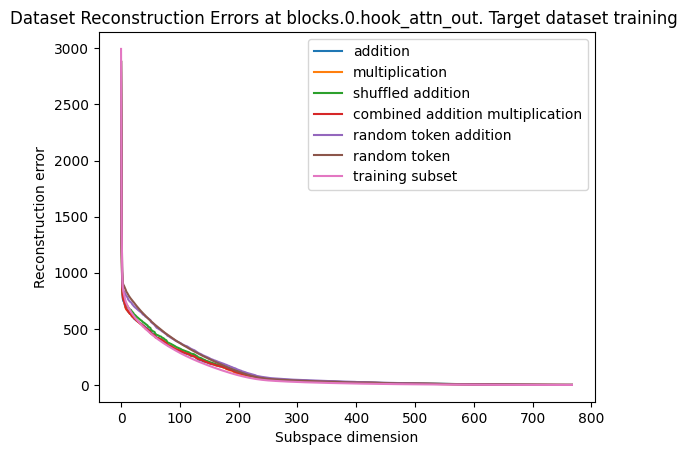

In [ ]:
training_errors = approximation_error_experiment('blocks.0.hook_attn_out', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

In [ ]:
training_errors = approximation_error_experiment('blocks.9.hook_attn_out', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

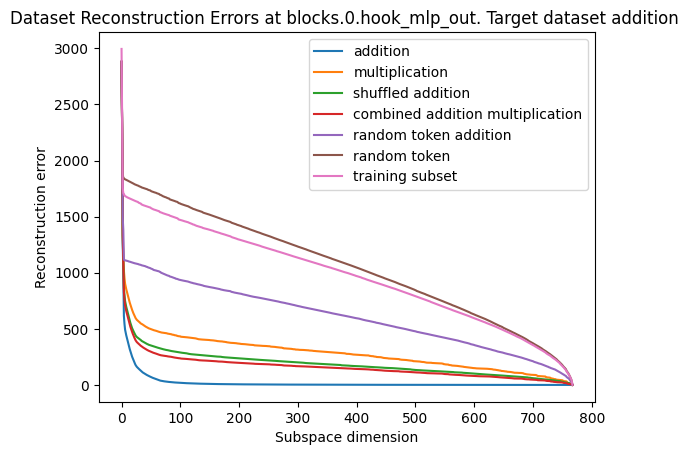

In [ ]:
training_errors = approximation_error_experiment('blocks.0.hook_mlp_out', {"addition": addition_dataset}, None, datasets_lang, datasets_tokens)

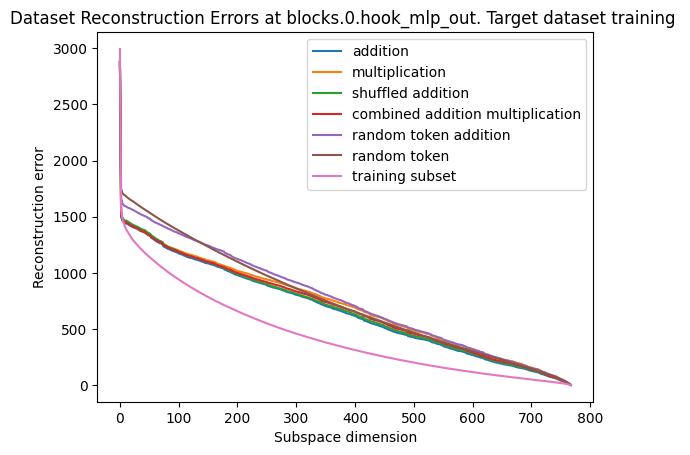

In [ ]:
training_errors = approximation_error_experiment('blocks.0.hook_mlp_out', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

In [ ]:
training_errors = approximation_error_experiment('blocks.9.hook_mlp_out', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

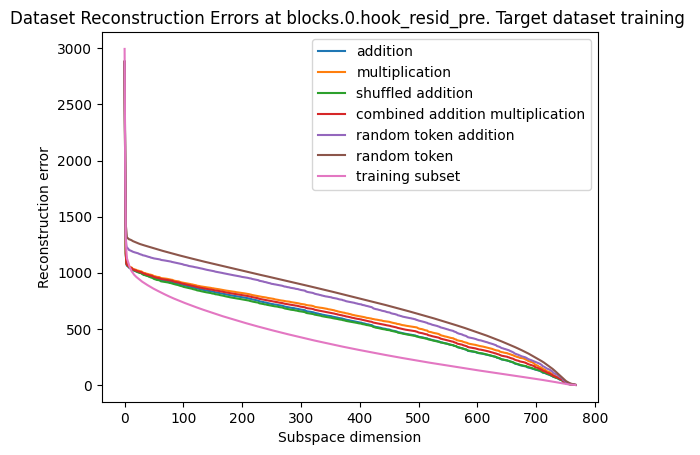

In [ ]:
training_errors = approximation_error_experiment('blocks.0.hook_resid_pre', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

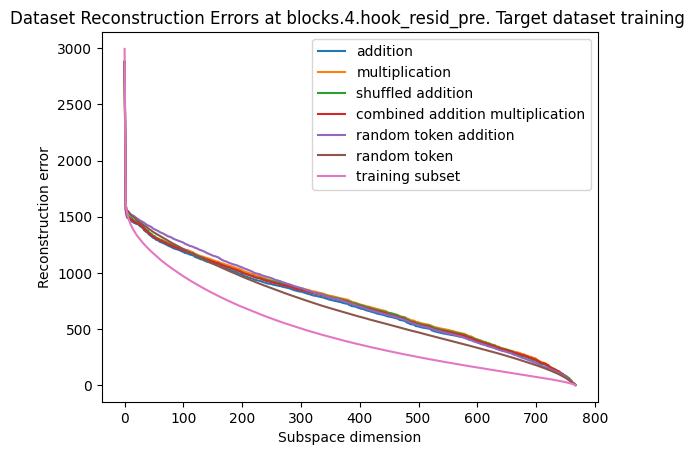

In [ ]:
training_errors = approximation_error_experiment('blocks.4.hook_resid_pre', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

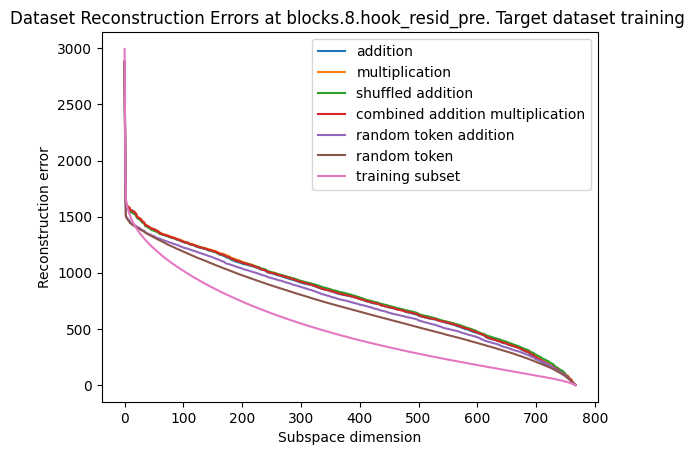

In [ ]:
training_errors = approximation_error_experiment('blocks.8.hook_resid_pre', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

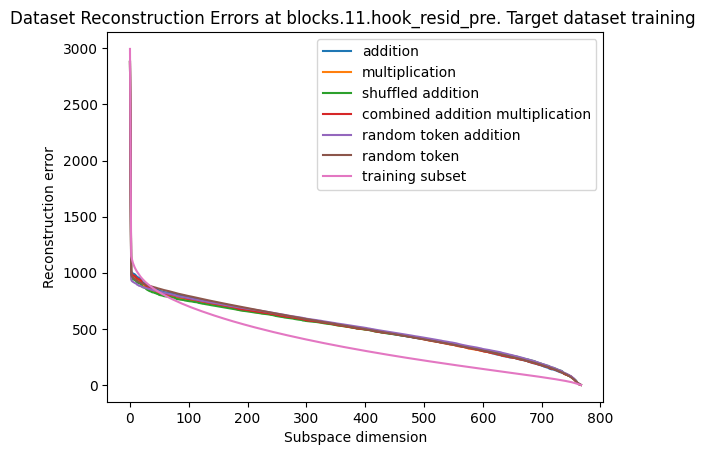

In [ ]:
training_errors = approximation_error_experiment('blocks.11.hook_resid_pre', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

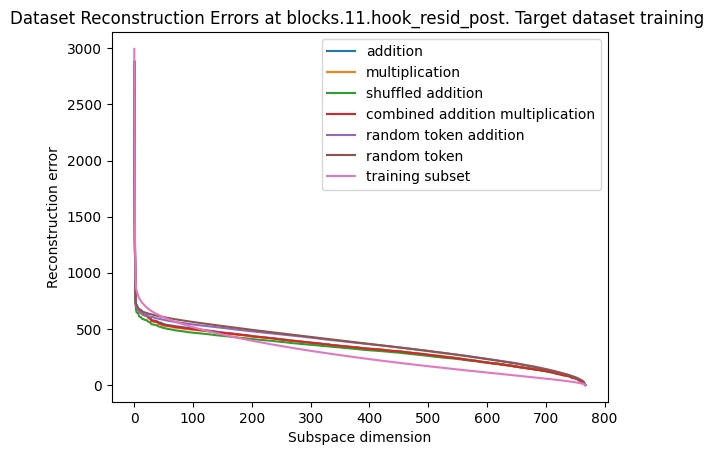

In [ ]:
training_errors = approximation_error_experiment('blocks.11.hook_resid_post', None, {"training":training_subset_tokens}, datasets_lang, datasets_tokens)

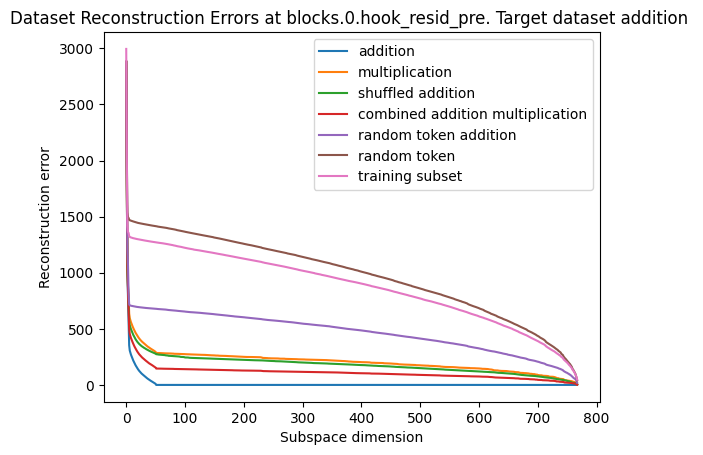

In [ ]:
add_errors = approximation_error_experiment('blocks.0.hook_resid_pre', {"addition":addition_dataset}, None, datasets_lang, datasets_tokens)

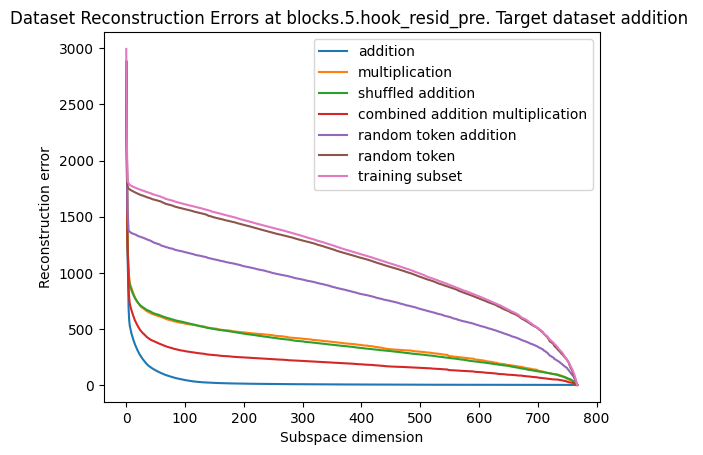

In [ ]:
add_errors = approximation_error_experiment('blocks.5.hook_resid_pre', {"addition":addition_dataset}, None, datasets_lang, datasets_tokens)

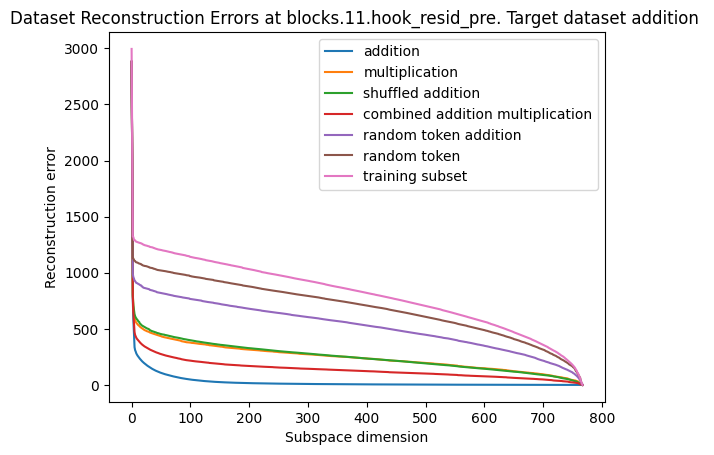

In [ ]:
add_errors = approximation_error_experiment('blocks.11.hook_resid_pre', {"addition":addition_dataset}, None, datasets_lang, datasets_tokens)

In [ ]:
add_errors = approximation_error_experiment('blocks.2.hook_attn_out', addition_dataset, datasets_lang, datasets_tokens)


TypeError: ignored

In [ ]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out', 'blocks.1.hook_resid_post', 'blocks.2.hook_re

In [ ]:
shuffled_addition_dataset

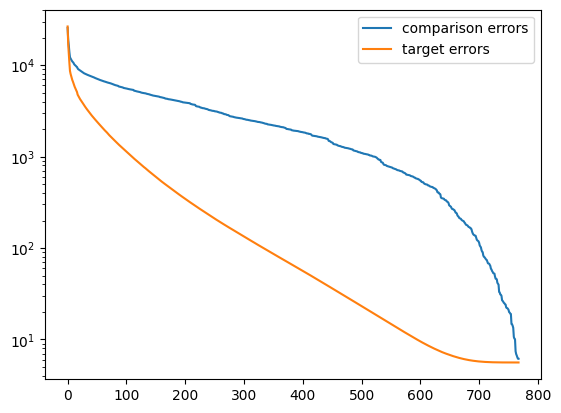

In [ ]:
add_to_add_errors, add_to_add_mult_errors = approximation_error_experiment('blocks.6.hook_attn_out', addition_dataset, combined_add_mult_dataset)

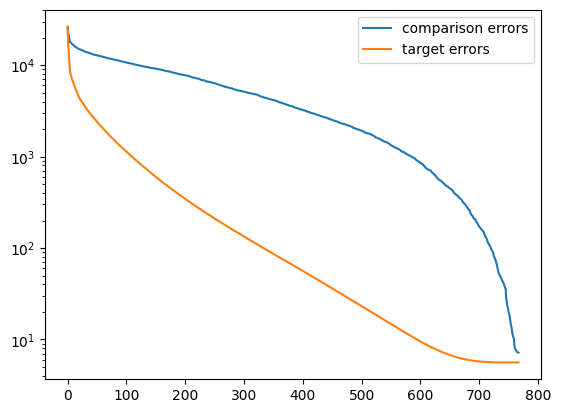

In [ ]:
_, add_to_shuffle_add_errors = approximation_error_experiment('blocks.6.hook_attn_out', addition_dataset, shuffled_addition_dataset)

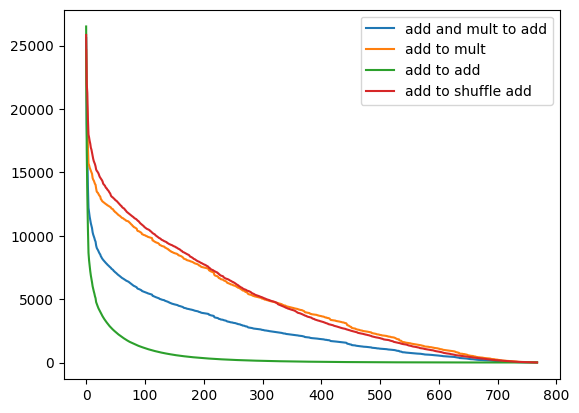

In [ ]:
plt.plot(add_to_add_mult_errors, label = "add and mult to add")

plt.plot(add_to_mult_errors, label = "add to mult")

plt.plot(add_to_add_errors, label = "add to add")

plt.plot(add_to_shuffle_add_errors, label = "add to shuffle add")

plt.legend()

plt.show()

In [ ]:
# Get some activations, and their SVD

X = reshape_activations(dataset_activations(gpt2_small, addition_dataset)[1]['blocks.10.hook_attn_out'])

U, S, V_H = activation_SVD(gpt2_small, addition_dataset, 'blocks.10.hook_attn_out')

In [ ]:
X.shape

torch.Size([2880, 768])

In [ ]:
V_H.shape

torch.Size([768, 768])

Take the top 100 vectors (make this variable later)

In [ ]:
B = V_H[:5,:]
B.shape

torch.Size([5, 768])

In [ ]:
proj = dataset_projection(X, B)

In [ ]:
proj.shape

torch.Size([768, 2880])

In [ ]:
X - proj.T

tensor([[-0.0263,  0.0099, -0.0201,  ..., -0.0092,  0.1029, -0.0257],
        [ 0.0014, -0.0470, -0.0030,  ..., -0.0123, -0.0481,  0.0634],
        [-0.0932, -0.0374, -0.0821,  ...,  0.2173, -0.0627, -0.0448],
        ...,
        [-0.0042, -0.0051, -0.0080,  ...,  0.0078, -0.1070,  0.0166],
        [-0.1063,  0.0601, -0.0065,  ..., -0.0929, -0.0029,  0.0172],
        [ 0.1224, -0.0044,  0.2264,  ..., -0.3122, -0.2559,  0.0420]],
       device='cuda:0')

In [ ]:
X

tensor([[-0.0293,  0.0660, -0.0625,  ...,  0.0036,  0.0849, -0.1484],
        [ 0.0476, -0.0143, -0.0328,  ..., -0.0533, -0.1093, -0.0197],
        [-0.1216,  0.1484,  0.1427,  ...,  0.0973, -0.2093, -0.3007],
        ...,
        [-0.1366,  0.1794,  0.1007,  ...,  0.0113, -0.1213, -0.3013],
        [ 0.2269,  0.4723,  0.6062,  ..., -0.2518, -0.4945, -0.0391],
        [-0.0857, -0.0049,  0.4772,  ..., -0.6364, -0.3790, -0.2364]],
       device='cuda:0')

## Visualising Activations

Will make a general purpose function to visualise the activations of an arbitrary dataset, at arbitrary layers, using either PCA or t-SNE

In [ ]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out', 'blocks.1.hook_resid_post', 'blocks.2.hook_re

In [ ]:
_, cache = dataset_activations(gpt2_small, addition_dataset)
activation_cache = cache['blocks.0.hook_resid_pre']
activation_cache[:,-1,:].shape

torch.Size([576, 768])

In [ ]:
def activation_plot_single_dataset(
  model: HookedTransformer,
  dataset: List[str],
  labels_list: List,
  label_type: str,
  plot_type: str,
  location: str,
  dimension: int
):
  """
  Given a dataset, create a plot of the activations for the final token.
  Use gpt 2 small, look at any given location.
  Works for either numerical or categorical labels.
  Should support both t-SNE and PCA.
  """
  t.cuda.empty_cache()
  # Do the forward pass
  _, cache = dataset_activations(model, dataset)
  activation_cache = cache[location]
  # Take the final activations only
  final_activations = activation_cache[:,-1,:]
  # squeezed_activations = reshape_activations(activation_cache)

  # Convert the tensor to a numpy array as scikit-learn works with numpy arrays
  data_numpy = final_activations.cpu().numpy()

  # Initialize the t-SNE
  tsne = TSNE(n_components=2, random_state=21)

  # Fit and transform the data to 2D
  data_2d = tsne.fit_transform(data_numpy)

  # Plot the transformed data
  plt.figure(figsize=(6, 5))
  if label_type == "numeric":
    # We use a colormap to indicate the magnitude of the labels by color intensity
    sc = plt.scatter(data_2d[:, 0], data_2d[:, 1], c=labels_list, cmap='viridis', marker='o')
    # Add a colorbar to the plot
    cbar = plt.colorbar(sc)
    cbar.set_label('Label Value', rotation=270, labelpad=15)
  elif label_type == "categories":
    for label in set(labels_list):
      idxs = [idx for idx, lbl in enumerate(labels_list) if lbl == label]
      plt.scatter(data_2d[idxs, 0], data_2d[idxs, 1], label=str(label))
  else:
    print("bad!")
    return


  # for label in set(labels_list):
  #   idxs = [idx for idx, lbl in enumerate(labels_list) if lbl == label]
  #   plt.scatter(data_2d[idxs, 0], data_2d[idxs, 1], label=str(label))
  # plt.scatter(data_2d[:, 0], data_2d[:, 1], marker='o')
  plt.xlabel('t-SNE feature 0')
  plt.ylabel('t-SNE feature 1')
  plt.title('t-SNE visualization of the data')
  plt.legend(title="Labels")
  plt.show()


### Addition Residual Stream Plots

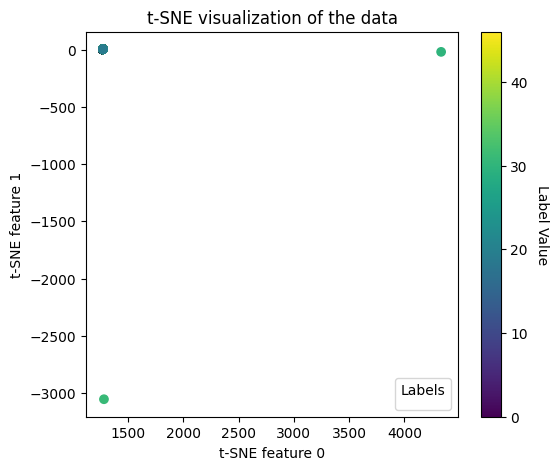

In [ ]:
activation_plot_single_dataset(
  gpt2_small,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.0.hook_resid_pre",
  None)

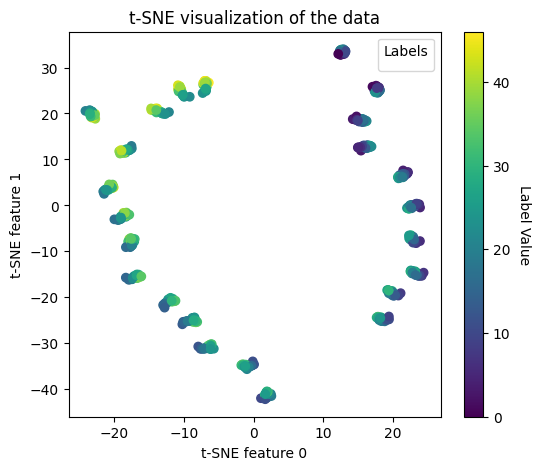

In [ ]:
activation_plot_single_dataset(
  gpt2_small,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.4.hook_resid_pre",
  None)

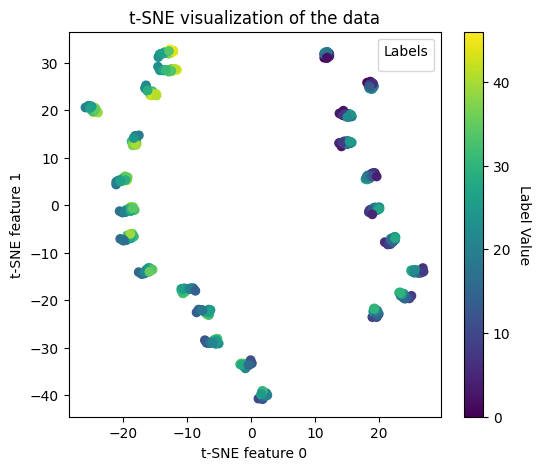

In [ ]:
activation_plot(addition_dataset, None, "blocks.4.hook_resid_pre", None)

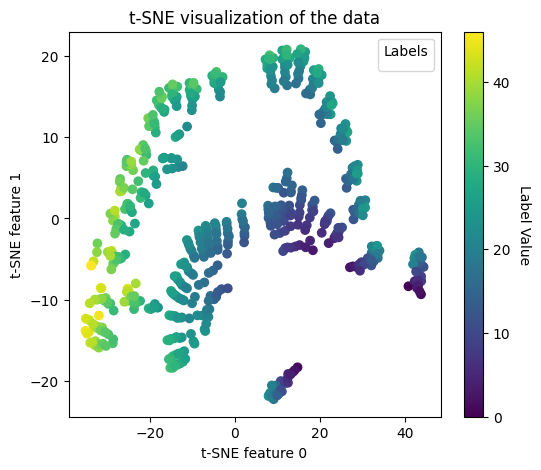

In [ ]:
activation_plot(addition_dataset, None, "blocks.6.hook_resid_post", None)

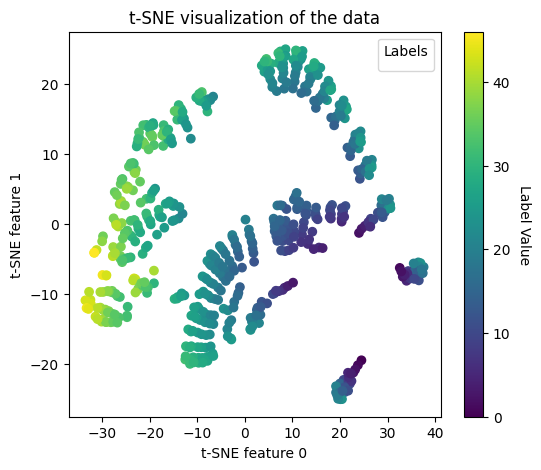

In [ ]:
activation_plot(addition_dataset, None, "blocks.7.hook_resid_post", None)

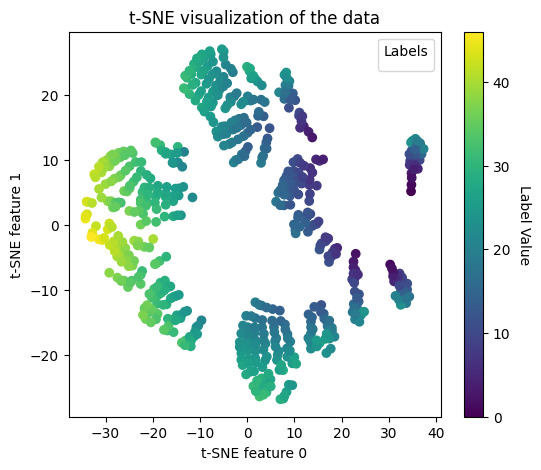

In [ ]:
activation_plot(addition_dataset, None, "blocks.8.hook_resid_post", None)

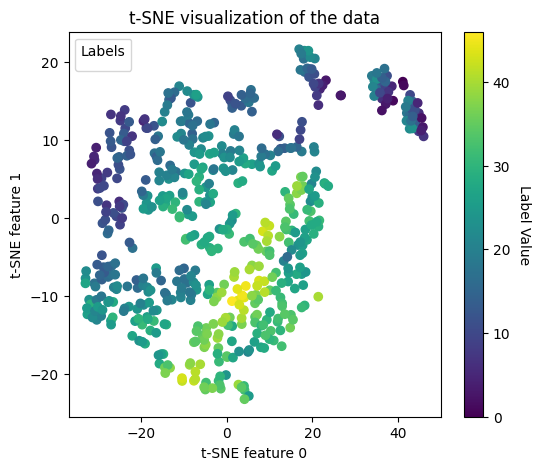

In [ ]:
activation_plot(addition_dataset, None, "blocks.11.hook_resid_post", None)

### Addition Attention Plots

In [ ]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out', 'blocks.1.hook_resid_post', 'blocks.2.hook_re

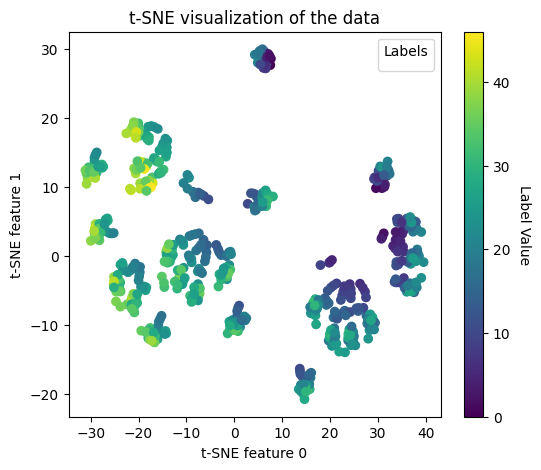

In [ ]:
activation_plot(addition_dataset, None, "blocks.0.hook_attn_out", None)

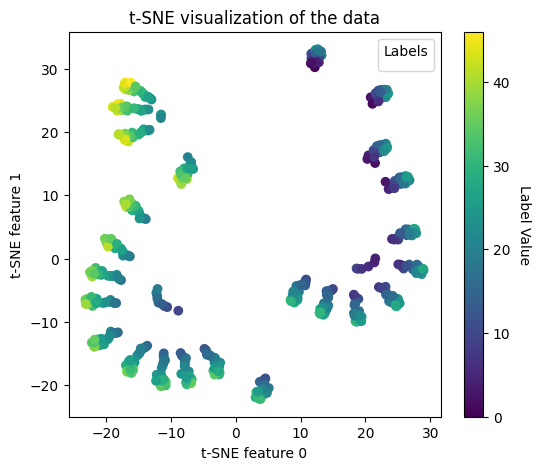

In [ ]:
activation_plot(addition_dataset, None, "blocks.3.hook_attn_out", None)

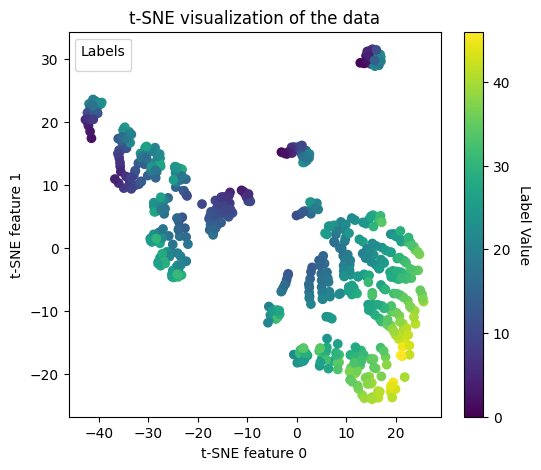

In [ ]:
activation_plot(addition_dataset, None, "blocks.7.hook_attn_out", None)

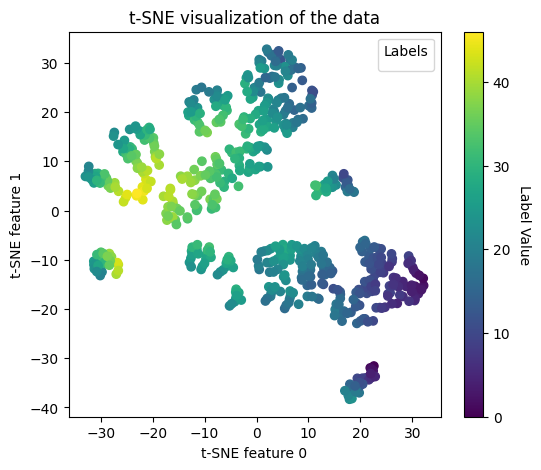

In [ ]:
activation_plot(addition_dataset, None, "blocks.10.hook_attn_out", None)

### Addition MLP Plots

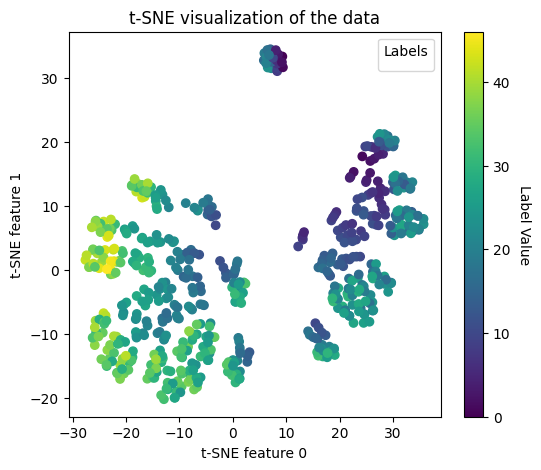

In [ ]:
activation_plot(addition_dataset, None, "blocks.0.hook_mlp_out", None)

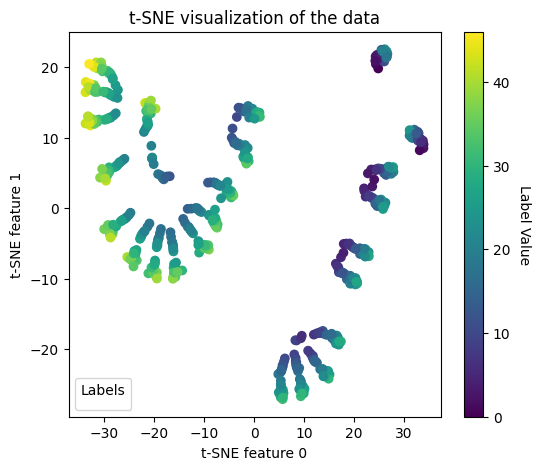

In [ ]:
activation_plot(addition_dataset, None, "blocks.4.hook_mlp_out", None)

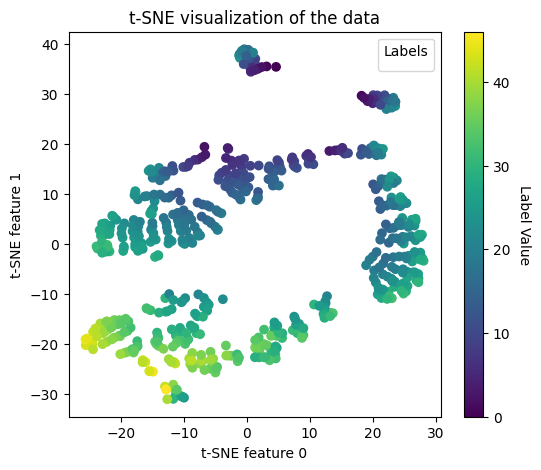

In [ ]:
activation_plot(addition_dataset, None, "blocks.7.hook_mlp_out", None)

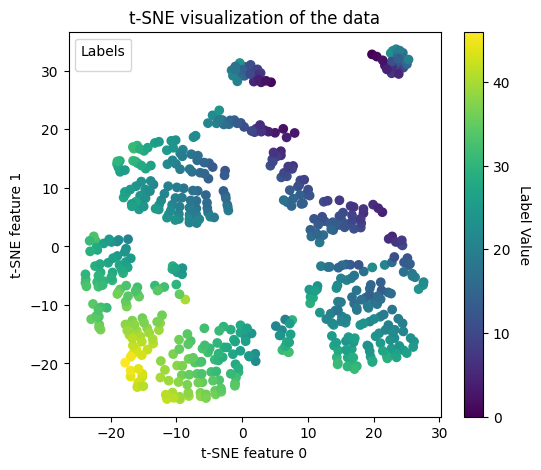

In [ ]:
activation_plot(addition_dataset, None, "blocks.9.hook_mlp_out", None)

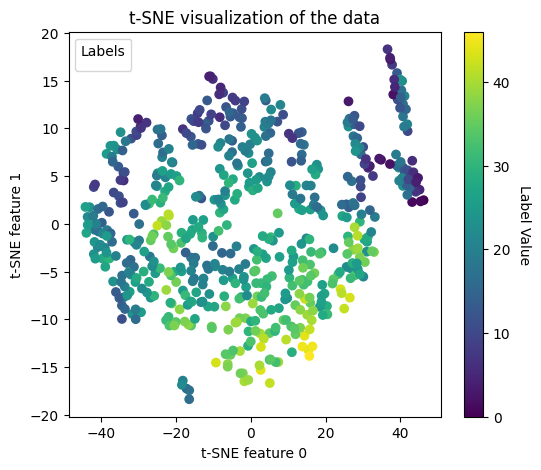

In [ ]:
activation_plot(addition_dataset, None, "blocks.11.hook_mlp_out", None)

### Multiplication Residual Stream Plots

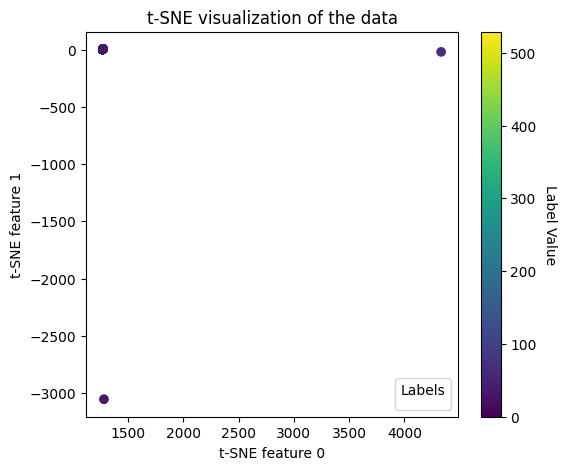

In [ ]:
activation_plot(multiplication_dataset, None, "blocks.0.hook_resid_pre", None)

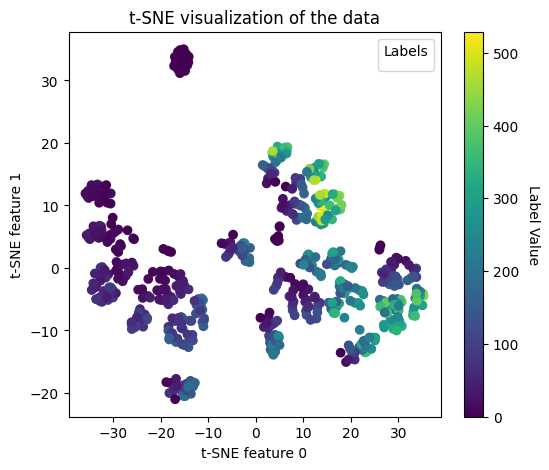

In [ ]:
activation_plot(multiplication_dataset, None, "blocks.0.hook_resid_post", None)

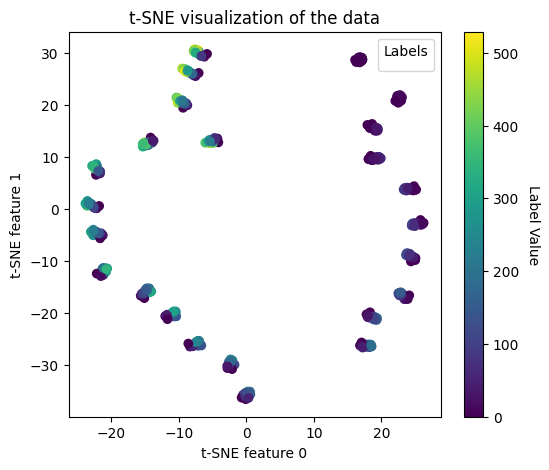

In [ ]:
activation_plot(multiplication_dataset, None, "blocks.3.hook_resid_post", None)

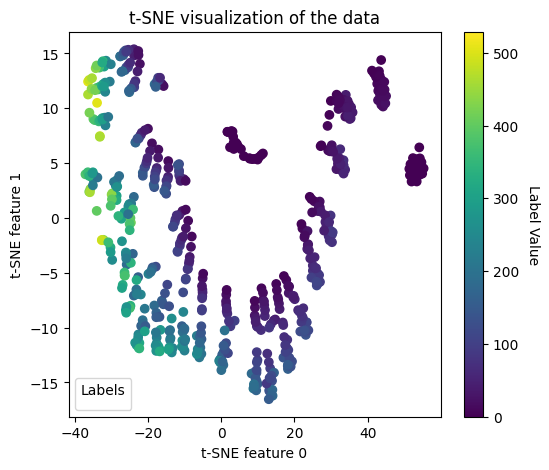

In [ ]:
activation_plot(multiplication_dataset, None, "blocks.7.hook_resid_post", None)

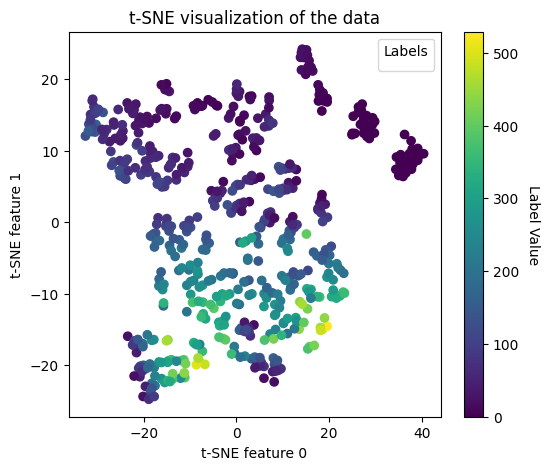

In [ ]:
activation_plot(multiplication_dataset, None, "blocks.11.hook_resid_post", None)

### GPT2-large experiments

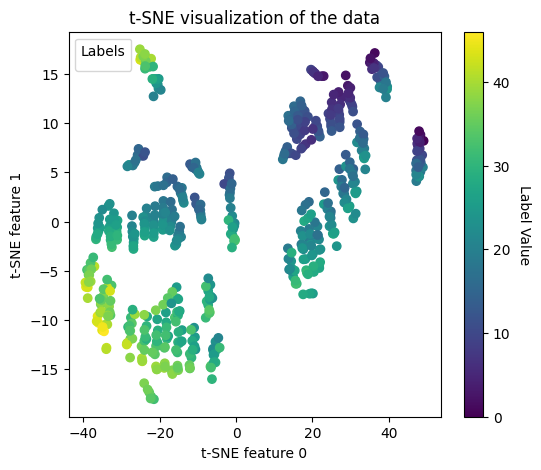

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.6.hook_resid_pre",
  None
)

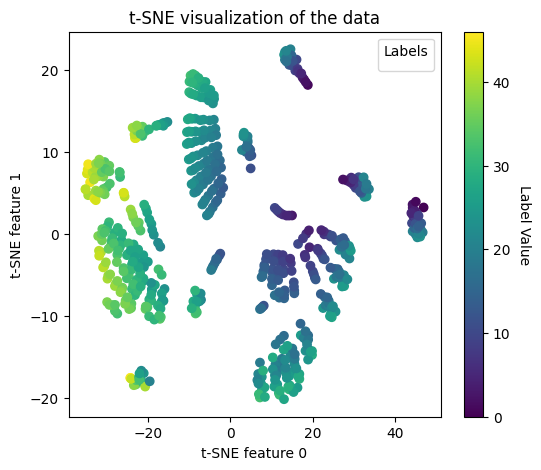

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.12.hook_resid_pre",
  None
)

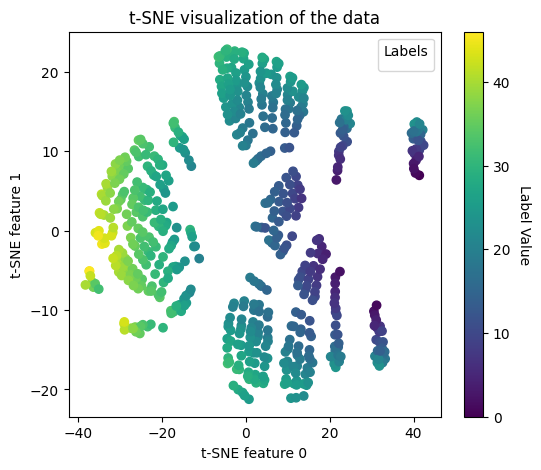

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.20.hook_resid_pre",
  None
)

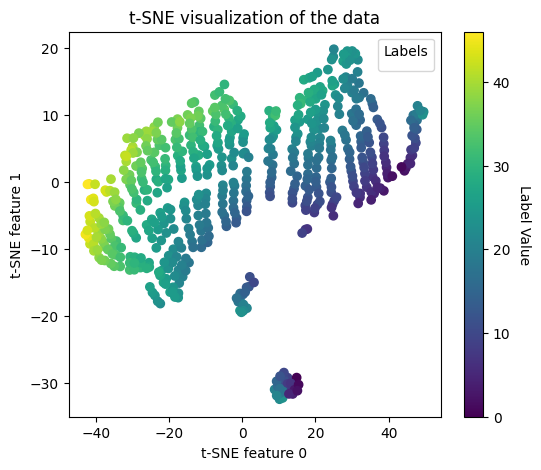

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.27.hook_resid_post",
  None
)

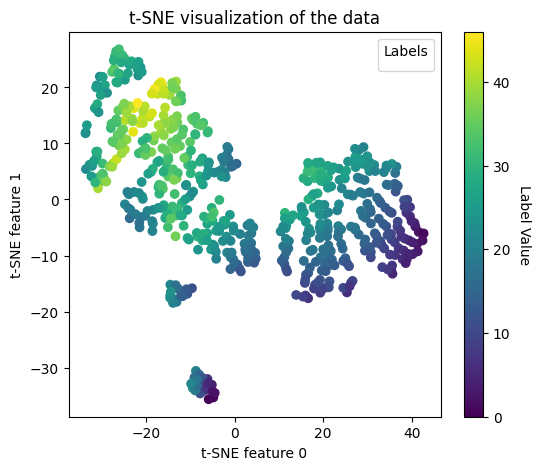

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.35.hook_resid_post",
  None
)

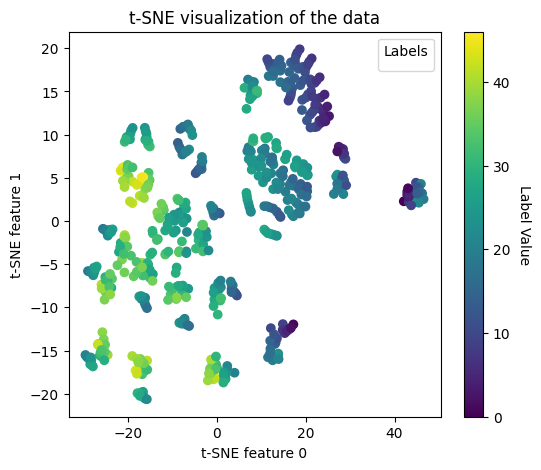

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.0.hook_attn_out",
  None
)

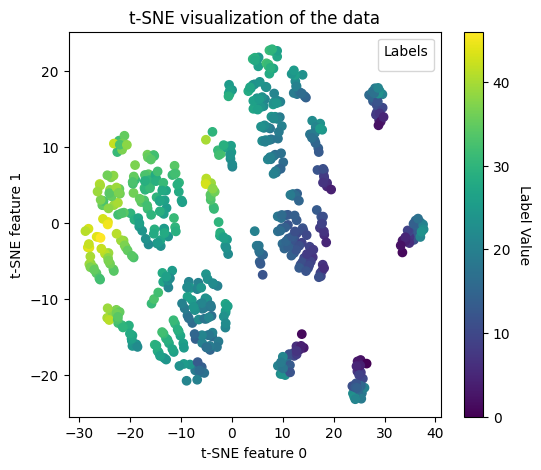

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.5.hook_attn_out",
  None
)

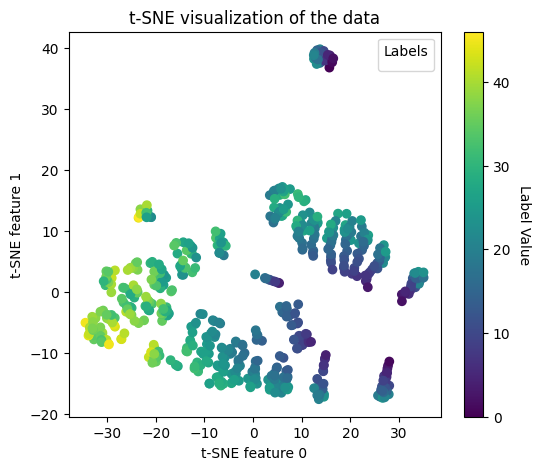

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.11.hook_attn_out",
  None
)

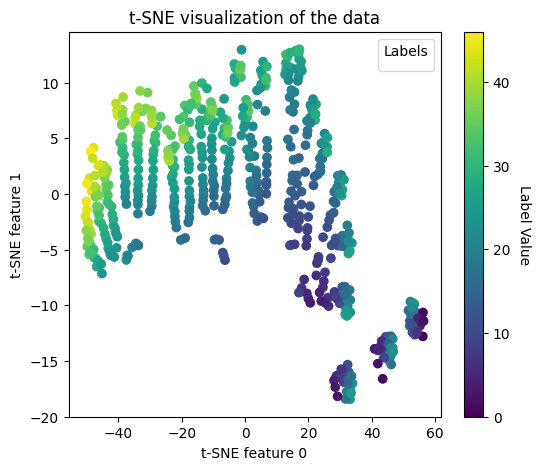

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.18.hook_attn_out",
  None
)

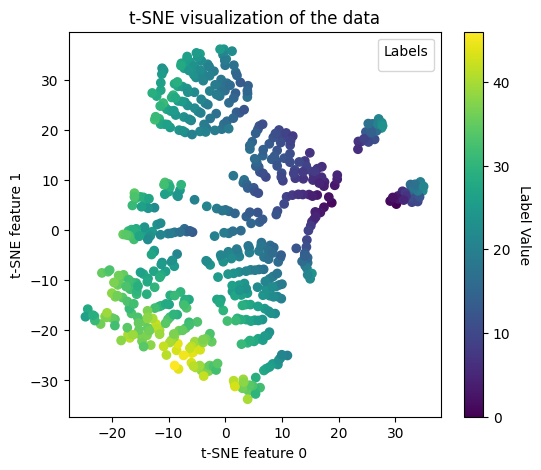

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.25.hook_attn_out",
  None
)

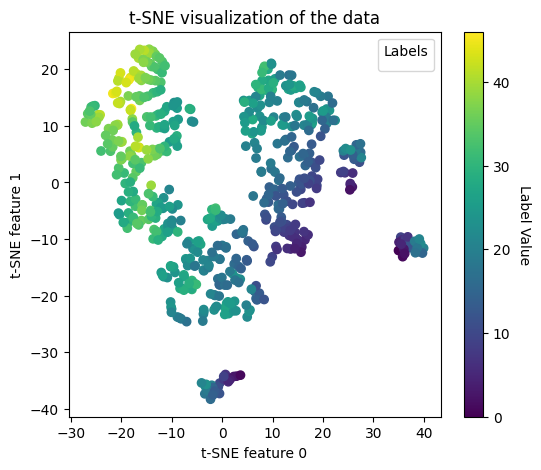

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.30.hook_attn_out",
  None
)

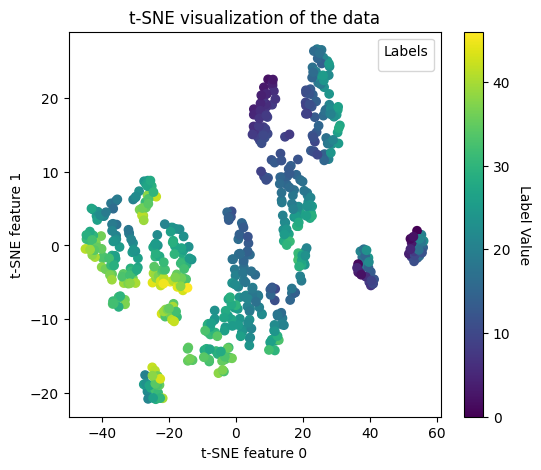

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.35.hook_attn_out",
  None
)

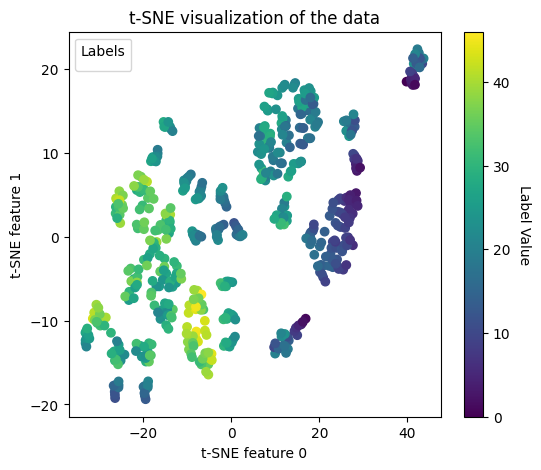

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.0.hook_mlp_out",
  None
)

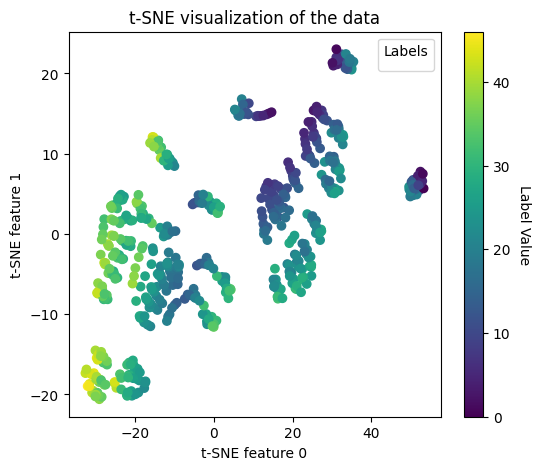

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.6.hook_mlp_out",
  None
)

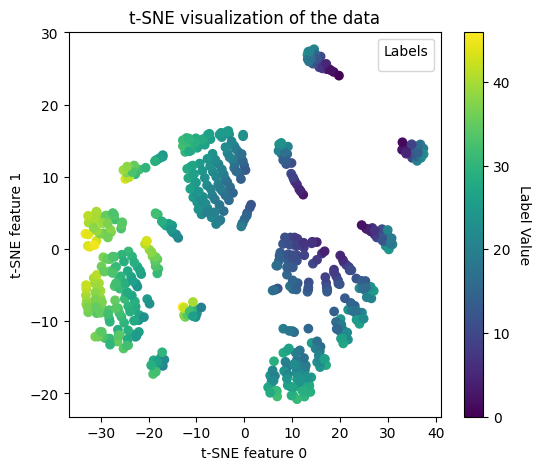

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.12.hook_mlp_out",
  None
)

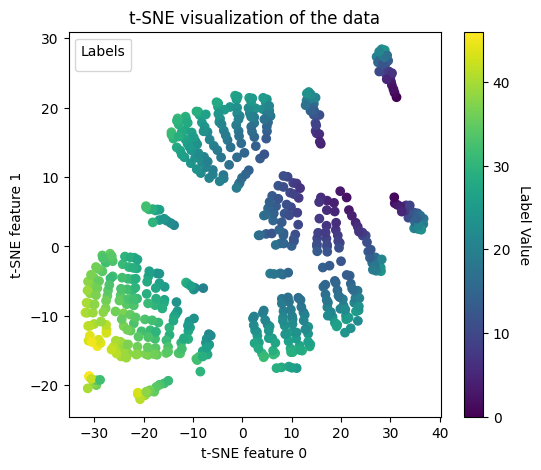

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.18.hook_mlp_out",
  None
)

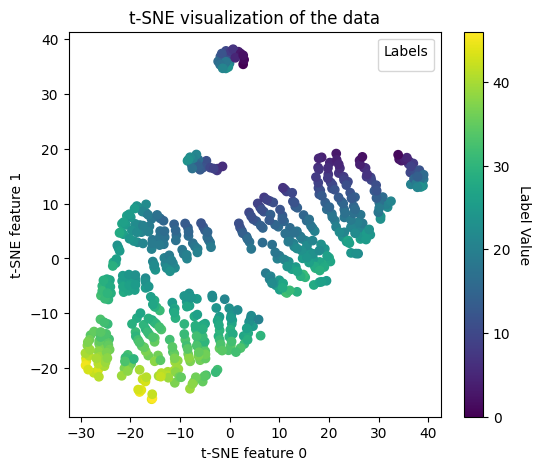

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.24.hook_mlp_out",
  None
)

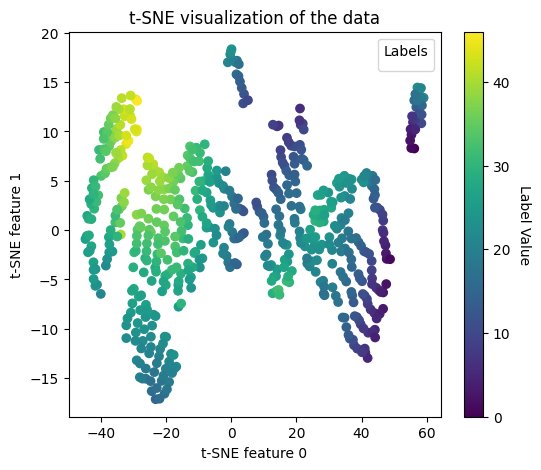

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.30.hook_mlp_out",
  None
)

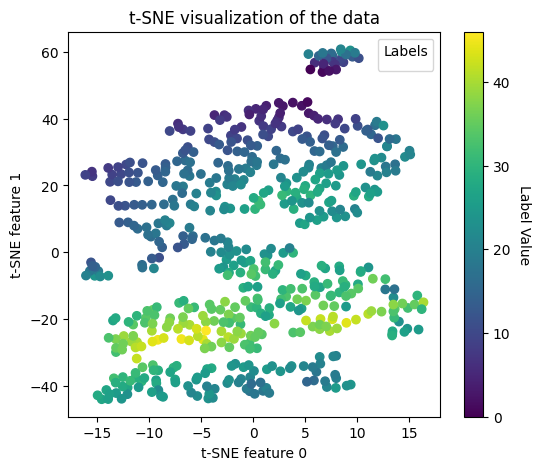

In [ ]:
activation_plot_single_dataset(
  gpt2_large,
  addition_dataset,
  [eval(x[:-1]) for x in addition_dataset],
  "numeric",
  None,
  "blocks.35.hook_mlp_out",
  None
)

## Inter-Dataset Activations (Numeric)



In [ ]:
datasets_lang2 = {
    "odd addition": odd_addition_dataset,
    "even addition": even_addition_dataset,
    "even multiplication": even_multiplication_dataset,
    "odd multiplication": odd_multiplication_dataset,
    "shuffled addition": shuffled_addition_dataset,
    # "combined addition multiplication": combined_add_mult_dataset
}

datasets_tokens = {
    "random token addition": random_token_addition_dataset,
    "random token": random_tokens,
    "training subset": training_subset_tokens
}

In [ ]:
def activation_plot_multiple_datasets(
  model: HookedTransformer,
  datasets_lang: List[str],
  datasets_tokens: List,
  plot_type: str,
  location: str,
  dimension: int,
  random: bool = False,
  centre: bool = True
):
  """
  Given a dataset, create a plot of the activations for the final token.
  Use gpt 2 small, look at any given location.
  Works for either numerical or categorical labels.
  Should support both t-SNE and PCA.
  """
  t.cuda.empty_cache()
  activation_dict = {}
  # Do the forward pass for each dataset
  for name in datasets_lang:
    dataset_lang = datasets_lang[name]
    activations = dataset_activations(model, dataset_lang)[1][location]
    # Looking at the final activations! Might want to change this?
    final_activations = activations[:,-1,:]

    # target_X = reshape_activations(activations)

    # Convert the tensor to a numpy array as scikit-learn works with numpy arrays
    data_numpy = final_activations.cpu().numpy()
    activation_dict[name] = data_numpy

  for name in datasets_tokens:
    dataset_token = datasets_tokens[name]
    activations = dataset_activations_tokens(model, dataset_token)[1][location]
    # Looking at the final activations! Might want to change this?
    final_activations = activations[:,-1,:]

    # target_X = reshape_activations(activations)

    # Convert the tensor to a numpy array as scikit-learn works with numpy arrays
    data_numpy = final_activations.cpu().numpy()
    activation_dict[name] = data_numpy

  all_data = []
  all_labels = []
  for label, data in activation_dict.items():
      all_data.append(data)
      all_labels.extend([label] * len(data))

  all_data = np.concatenate(all_data, axis=0)

  if random:

    # Determine the number of data points per label (assuming all labels have the same number of data points)
    num_points_per_label = len(activation_dict[list(activation_dict.keys())[0]])

    # Calculate the mean and variance of the entire dataset
    mean = np.mean(all_data, axis=0)
    variance = np.var(all_data, axis=0)
    # Generate some random data
    # Will use the same mean and variance as the data
    # Generate synthetic data with the same variance
    if centre:
      synthetic_data = np.random.normal(loc=mean, scale=np.sqrt(variance), size=(num_points_per_label, all_data.shape[1]))
    else:
      zeros = 0 * mean
      synthetic_data = np.random.normal(loc=zeros, scale=np.sqrt(variance), size=(num_points_per_label, all_data.shape[1]))
    synthetic_labels = ['Synthetic'] * len(synthetic_data)

    # Concatenate the synthetic data with the original data
    all_data = np.concatenate([all_data, synthetic_data], axis=0)
    all_labels.extend(synthetic_labels)



  # Initialize the t-SNE
  tsne = TSNE(n_components=2, random_state=21)

  # Fit and transform the data to 2D
  data_2d = tsne.fit_transform(all_data)

  # Shuffle the data and labels
  data_2d, all_labels = shuffle(data_2d, all_labels, random_state=42)

  # Plot the transformed data
  # Create a colormap for labels
  unique_labels = list(set(all_labels))
  colors = plt.cm.get_cmap('viridis', len(unique_labels))

  # Plot the transformed data with labels
  plt.figure(figsize=(6, 5))
  markers = ['o', 's', '^', 'D', 'P']

  # Plot all points together, coloring them based on their labels
  for i, label in enumerate(all_labels):
      color_idx = unique_labels.index(label)
      marker = markers[color_idx % len(markers)]
      plt.scatter(data_2d[i, 0], data_2d[i, 1], color=colors(color_idx), s=20, alpha=0.6, label=label if color_idx not in [unique_labels.index(lbl) for lbl in all_labels[:i]] else "", marker=marker)

  # Add a legend
  handles, labels = plt.gca().get_legend_handles_labels()
  plt.legend(handles, labels, title="Labels")

  plt.xlabel('t-SNE feature 0')
  plt.ylabel('t-SNE feature 1')
  plt.title(f't-SNE visualization of the final activations of {model.name} at {location}')
  plt.show()

  # plt.figure(figsize=(6, 5))
  # markers = ['o', 's', '^']
  # for idx, label in enumerate(set(all_labels)):
  #   idxs = [idx for idx, lbl in enumerate(all_labels) if lbl == label]
  #   plt.scatter(data_2d[idxs, 0], data_2d[idxs, 1], label=str(label), s=20, alpha=0.4, marker=markers[idx % len(markers)])

  # plt.xlabel('t-SNE feature 0')
  # plt.ylabel('t-SNE feature 1')
  # plt.title('t-SNE visualization of the data')
  # plt.legend(title="Labels")
  # plt.show()

In [ ]:
cache

### Residual Stream Plots

In [ ]:
gpt2_small.name

'gpt2_small'

<ipython-input-55-f4fd484c1038>:63: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



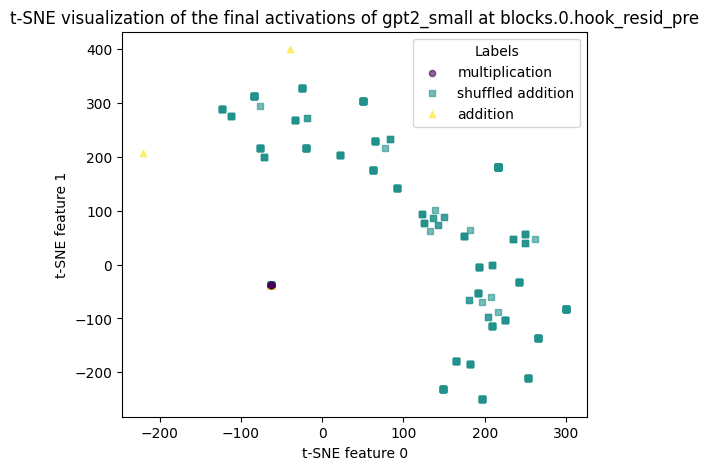

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.0.hook_resid_pre',
  dimension = 2
)

<ipython-input-59-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



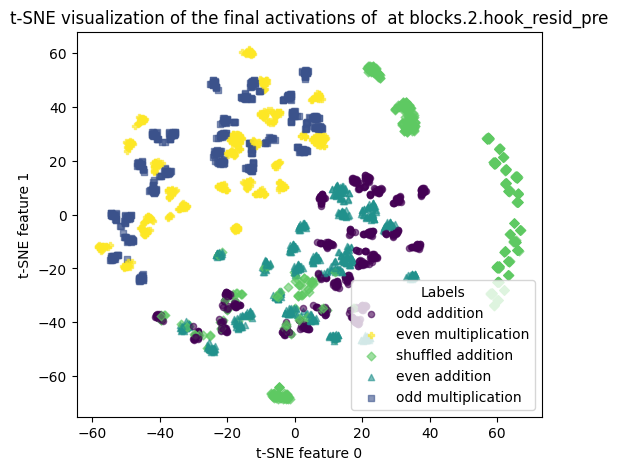

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.2.hook_resid_pre',
  dimension = 2
)

<ipython-input-59-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



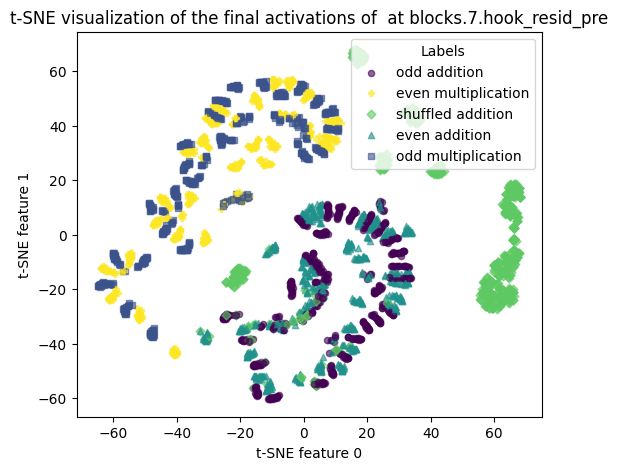

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.7.hook_resid_pre',
  dimension = 2
)

<ipython-input-41-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



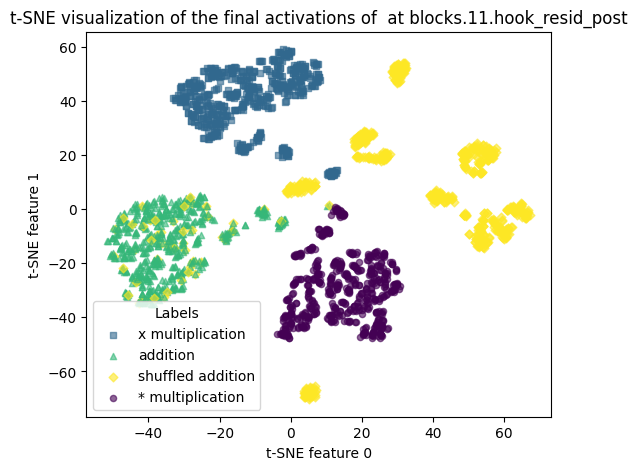

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_resid_pre',
  dimension = 2
)

TypeError: ignored

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

In [ ]:
shuffled_addition_dataset

### Attention Plots

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



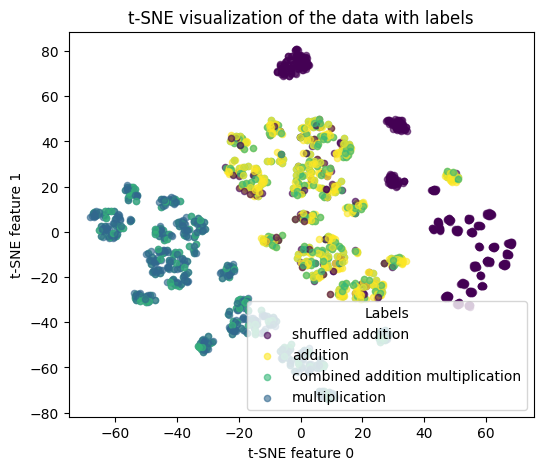

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.0.hook_attn_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



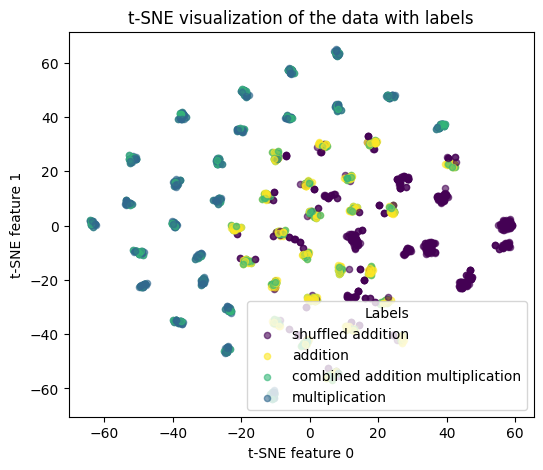

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.2.hook_attn_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



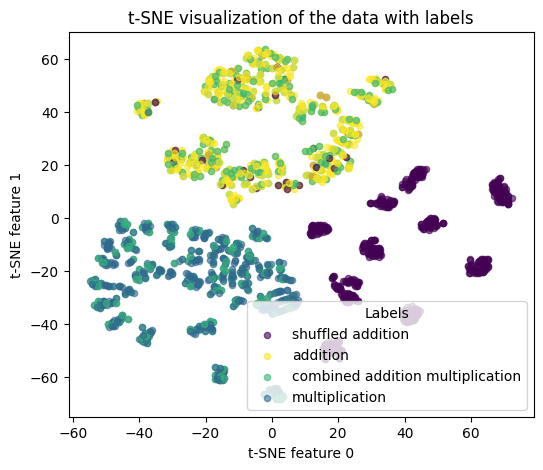

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.5.hook_attn_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



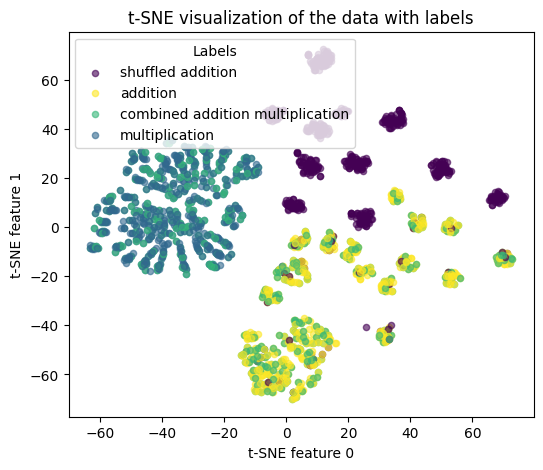

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.8.hook_attn_out',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.10.hook_attn_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



KeyboardInterrupt: ignored

### MLP Plots

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



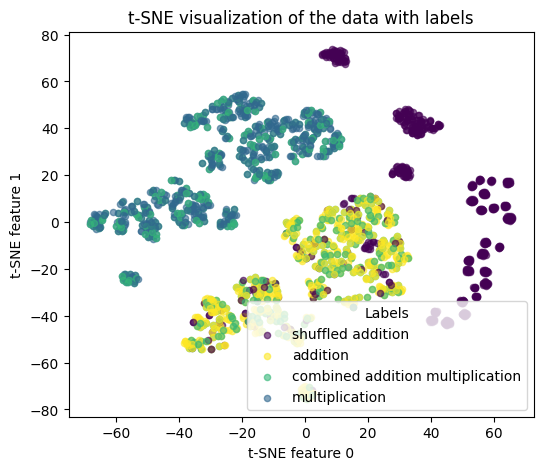

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.0.hook_mlp_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



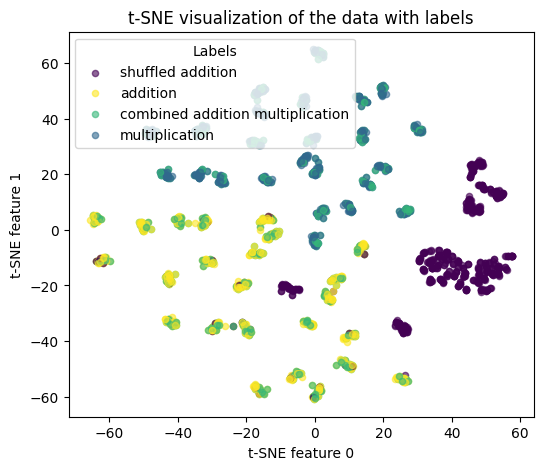

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.2.hook_mlp_out',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.5.hook_mlp_out',
  dimension = 2
)

<ipython-input-109-f40ce233e9a4>:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



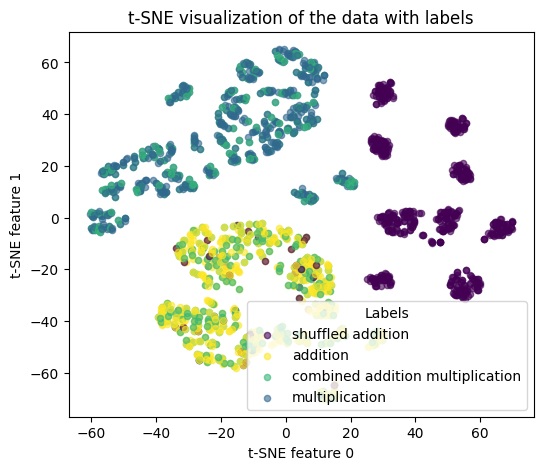

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.8.hook_mlp_out',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = datasets_lang,
  datasets_tokens = None,
  plot_type = None,
  location ='blocks.11.hook_mlp_out',
  dimension = 2
)

### GPT2 medium plots

<ipython-input-55-f4fd484c1038>:63: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



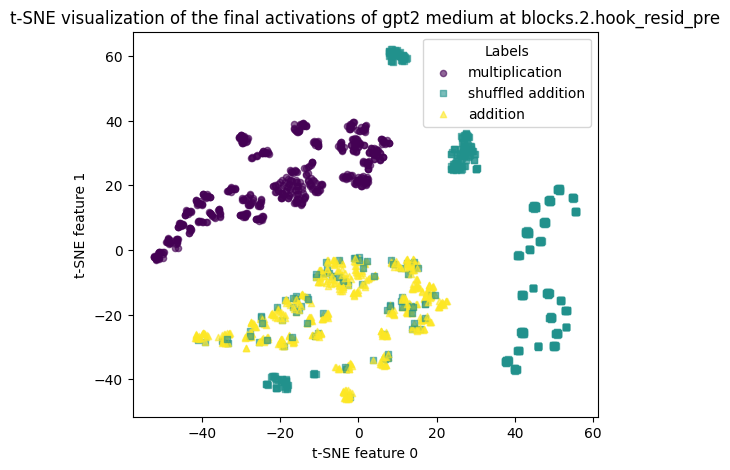

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.2.hook_resid_pre',
  dimension = 2
)

<ipython-input-55-f4fd484c1038>:63: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



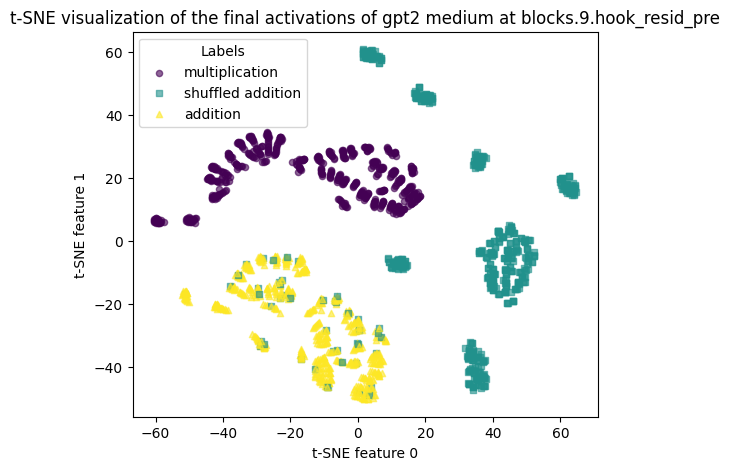

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.9.hook_resid_pre',
  dimension = 2
)

<ipython-input-55-f4fd484c1038>:63: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



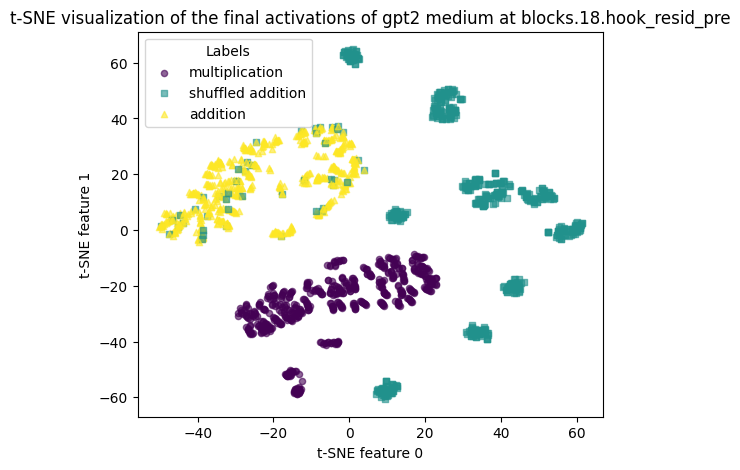

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.18.hook_resid_pre',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



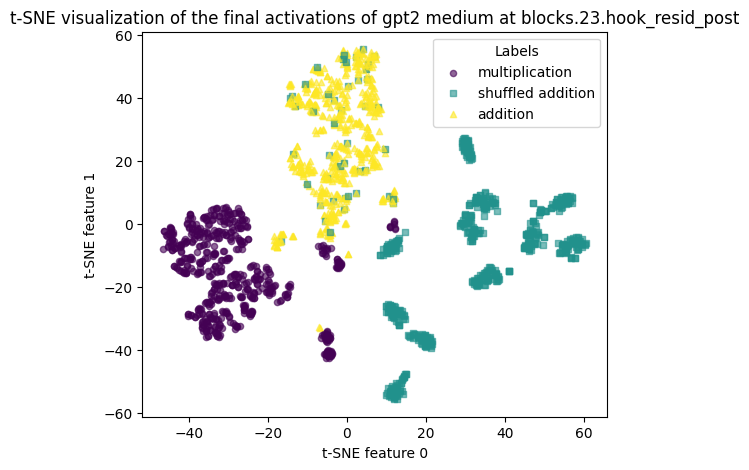

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.23.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



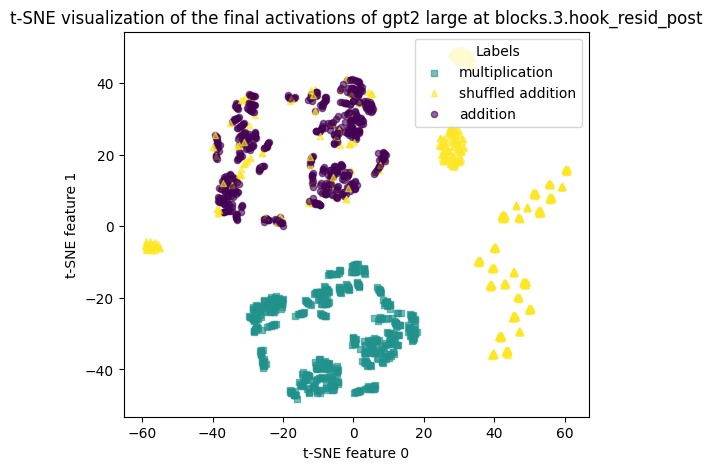

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



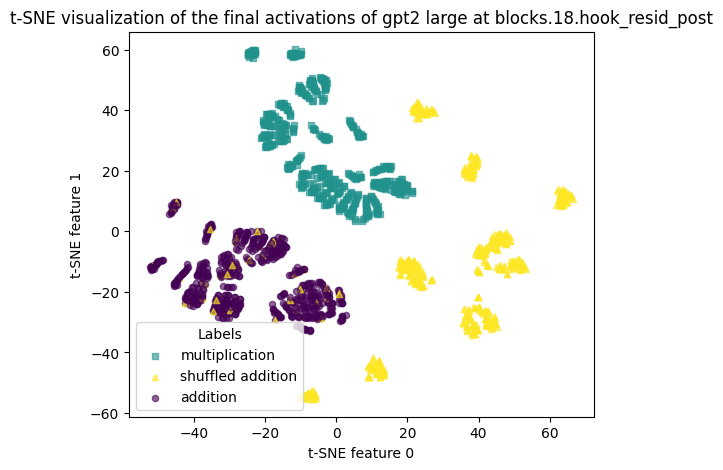

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.18.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



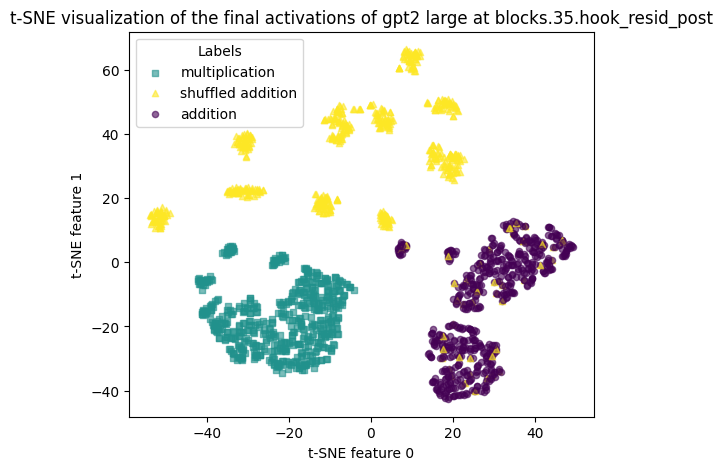

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.35.hook_resid_post',
  dimension = 2
)

### Including random points

<ipython-input-97-254dc8c7c63a>:84: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



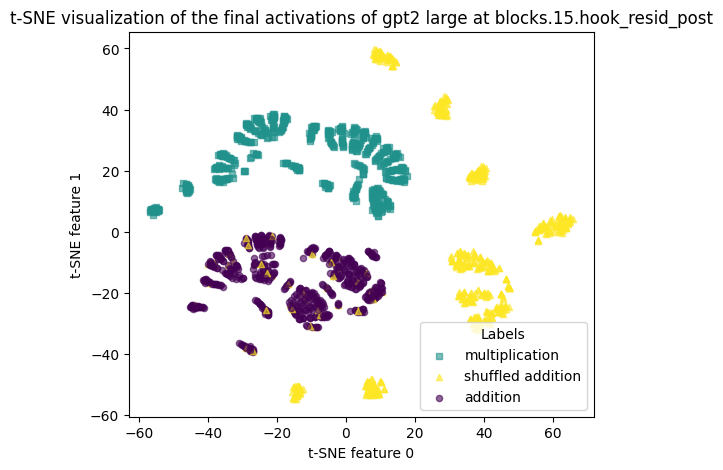

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.15.hook_resid_post',
  dimension = 2,
  random = False,
  centre = True
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



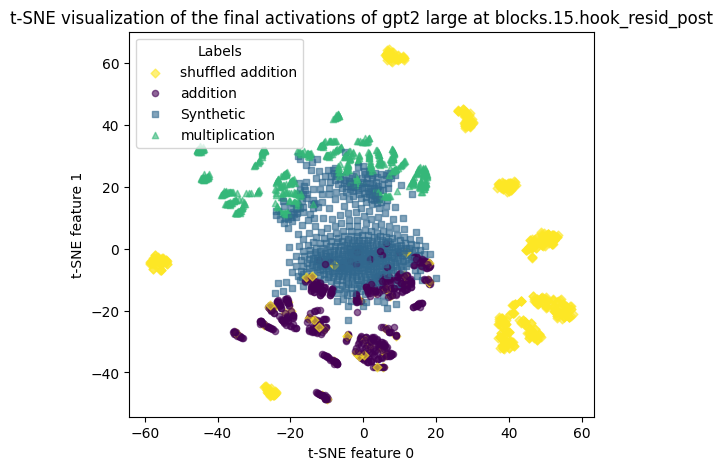

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.15.hook_resid_post',
  dimension = 2,
  random = True,
  centre = True
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



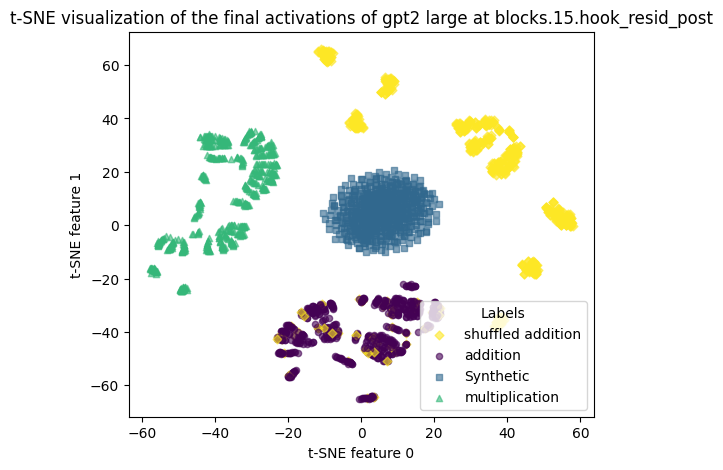

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.15.hook_resid_post',
  dimension = 2,
  random = True,
  centre = False
)

## Repetition Dataset Activations

<ipython-input-40-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



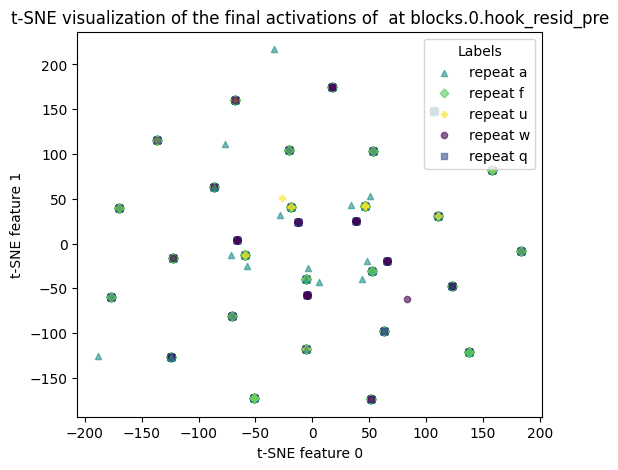

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.0.hook_resid_pre',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



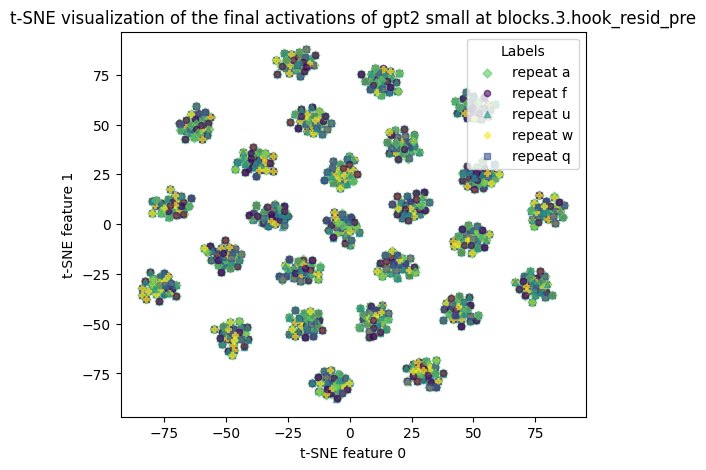

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.3.hook_resid_pre',
  dimension = 2
)

<ipython-input-40-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



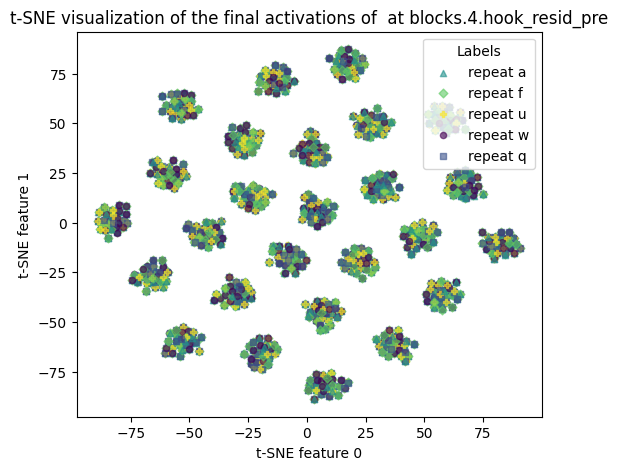

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.4.hook_resid_pre',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



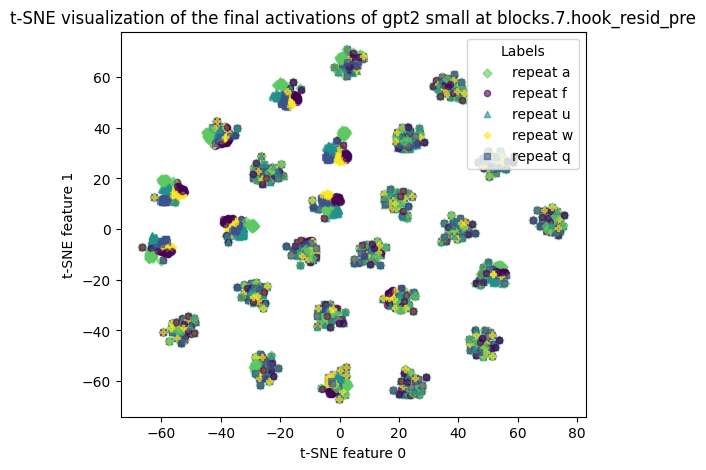

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.7.hook_resid_pre',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



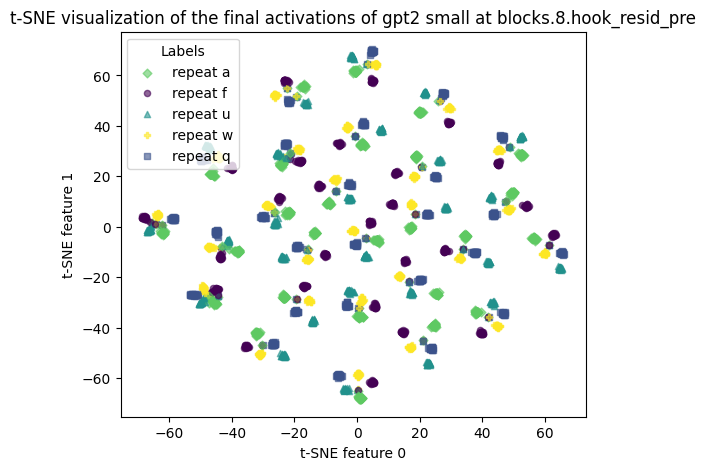

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.8.hook_resid_pre',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



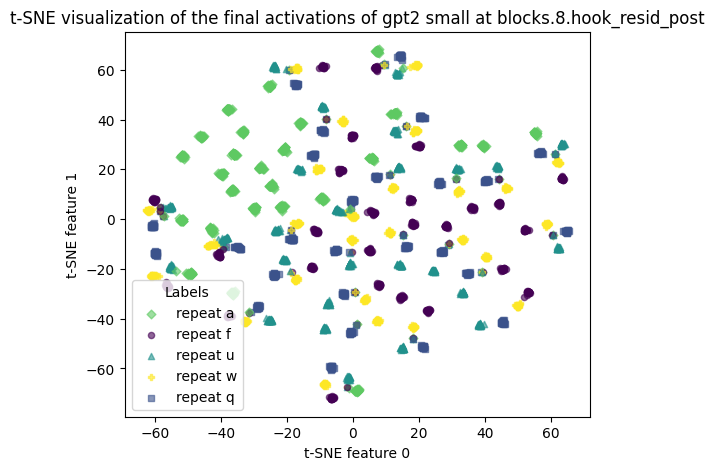

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.8.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



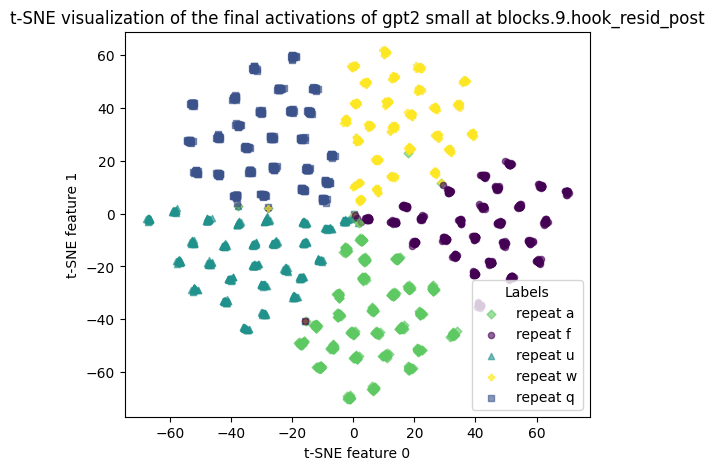

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.9.hook_resid_post',
  dimension = 2
)

<ipython-input-40-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



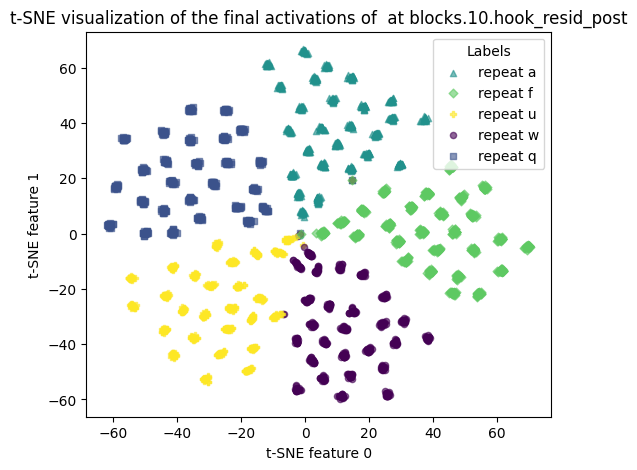

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.10.hook_resid_post',
  dimension = 2
)

<ipython-input-40-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



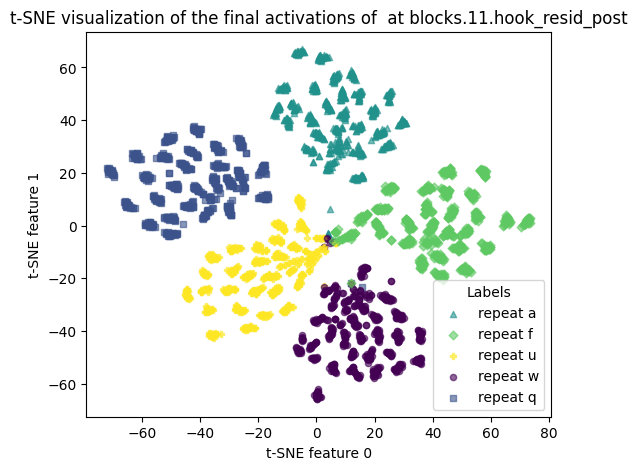

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



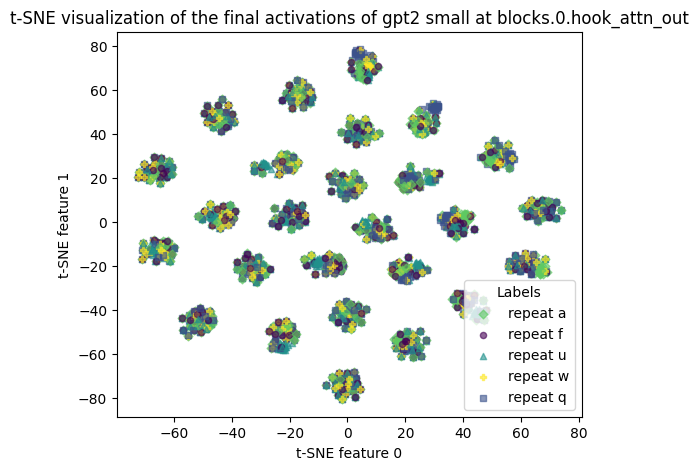

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.0.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



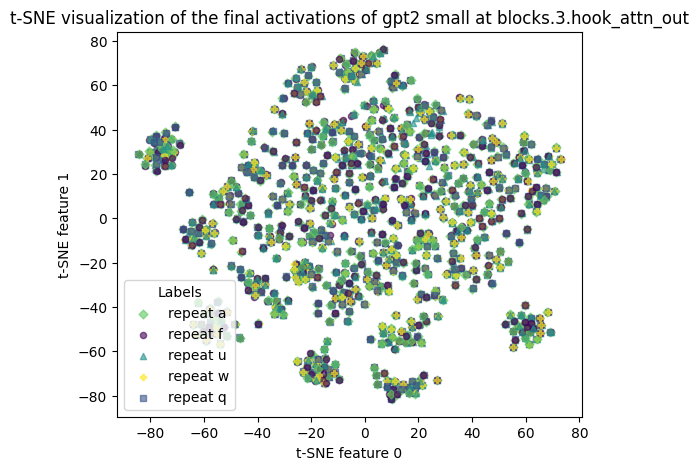

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.3.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



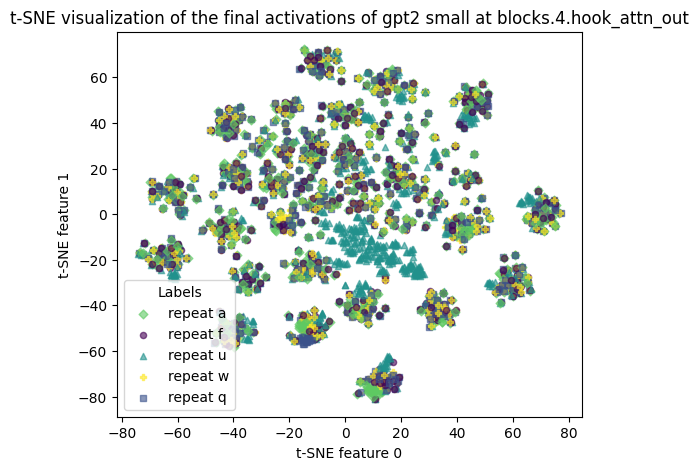

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.4.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



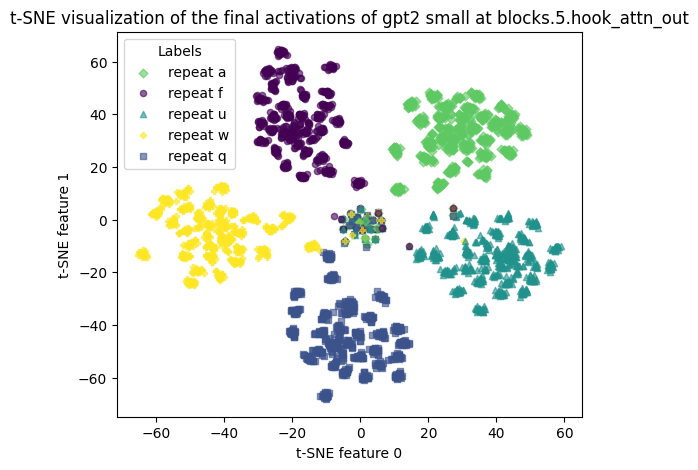

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.5.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



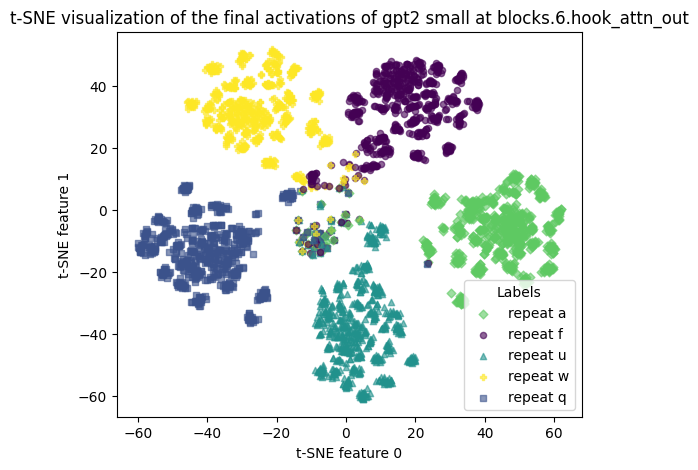

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.6.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



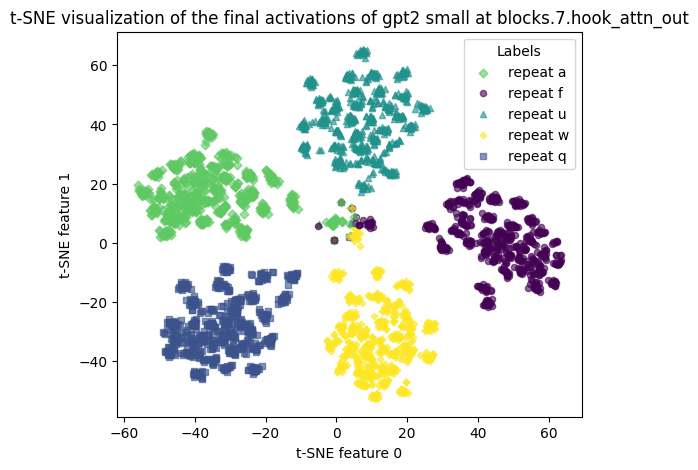

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.7.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



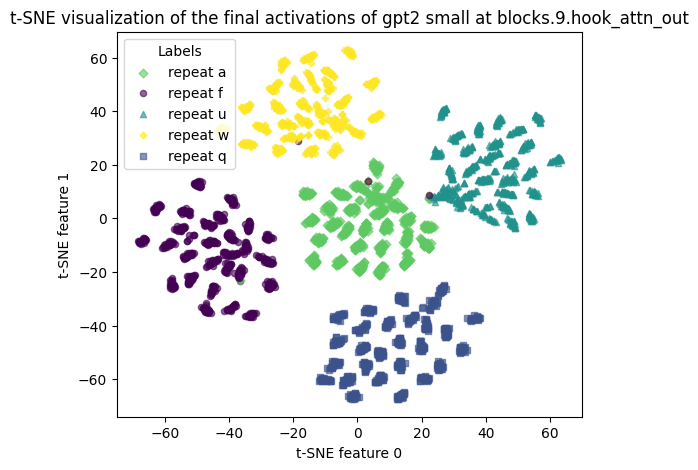

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.9.hook_attn_out',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



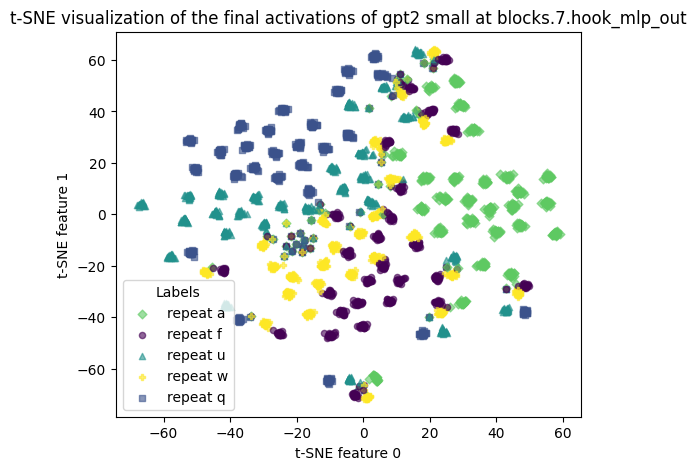

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.7.hook_mlp_out',
  dimension = 2
)

### GPT-2 Large

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



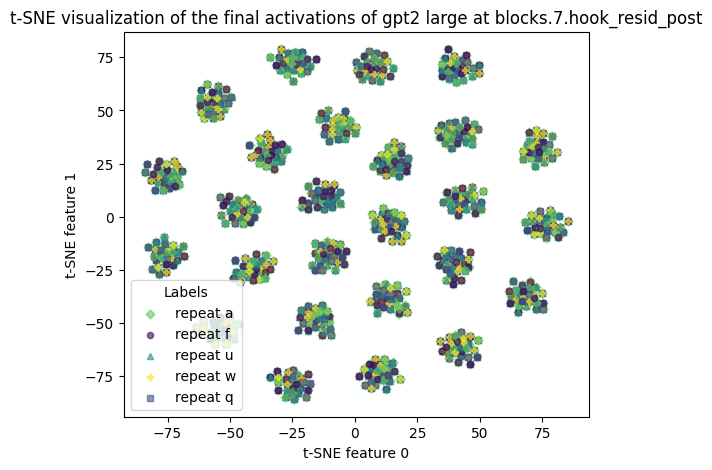

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.7.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



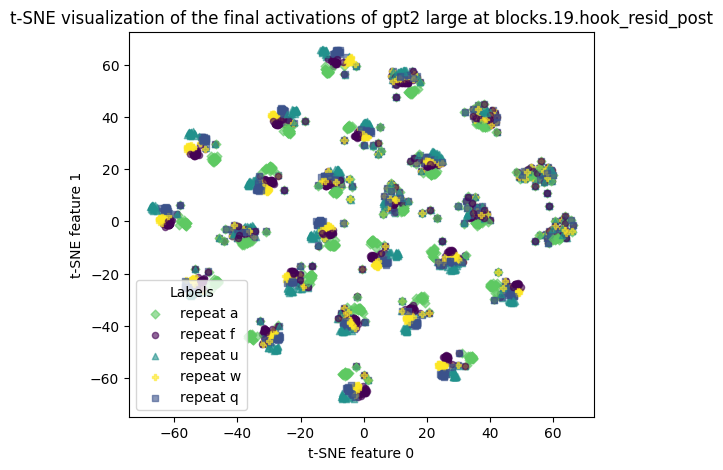

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.19.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



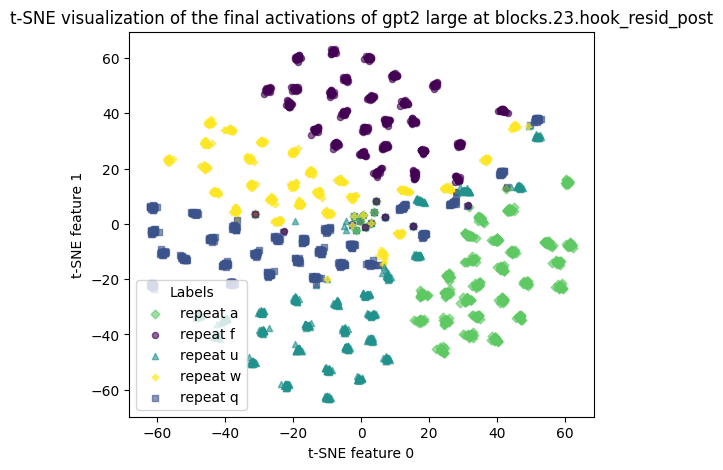

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.23.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



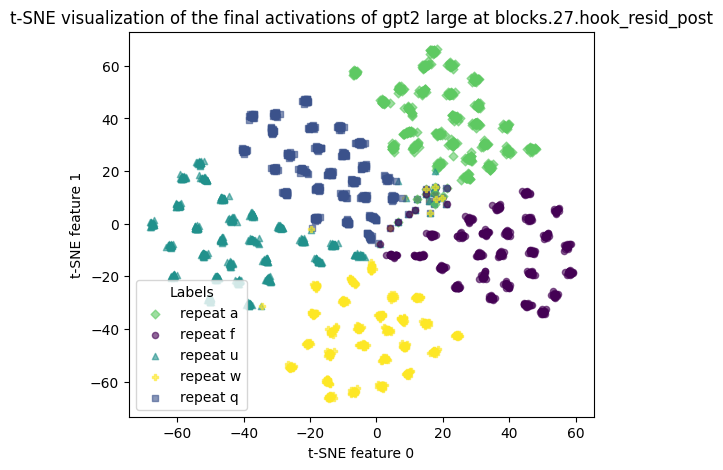

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.27.hook_resid_post',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.27.hook_resid_post',
  dimension = 2
)

<ipython-input-14-22079ec49601>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



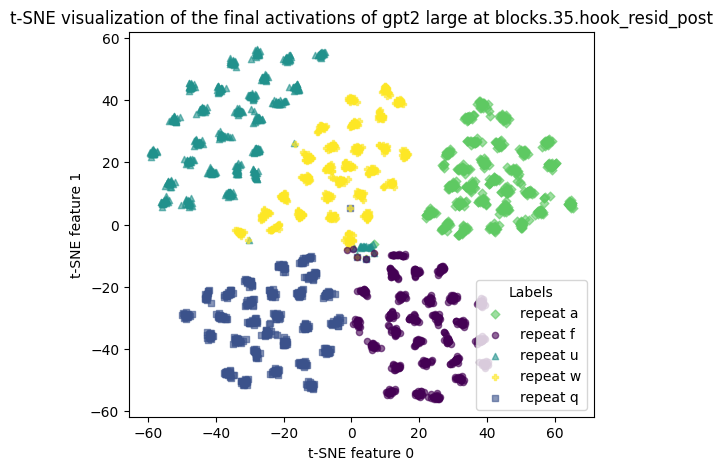

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = repetition_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.35.hook_resid_post',
  dimension = 2
)

In [ ]:
repetition_dataset_a

["Repeat the string 'a a a'. a a",
 "Repeat the string 'a b a'. a b",
 "Repeat the string 'a c a'. a c",
 "Repeat the string 'a d a'. a d",
 "Repeat the string 'a e a'. a e",
 "Repeat the string 'a f a'. a f",
 "Repeat the string 'a g a'. a g",
 "Repeat the string 'a h a'. a h",
 "Repeat the string 'a i a'. a i",
 "Repeat the string 'a j a'. a j",
 "Repeat the string 'a k a'. a k",
 "Repeat the string 'a l a'. a l",
 "Repeat the string 'a m a'. a m",
 "Repeat the string 'a n a'. a n",
 "Repeat the string 'a o a'. a o",
 "Repeat the string 'a p a'. a p",
 "Repeat the string 'a q a'. a q",
 "Repeat the string 'a r a'. a r",
 "Repeat the string 'a s a'. a s",
 "Repeat the string 'a t a'. a t",
 "Repeat the string 'a u a'. a u",
 "Repeat the string 'a v a'. a v",
 "Repeat the string 'a w a'. a w",
 "Repeat the string 'a x a'. a x",
 "Repeat the string 'a y a'. a y",
 "Repeat the string 'a z a'. a z",
 "Repeat the string 'b a a'. b a",
 "Repeat the string 'b b a'. b b",
 "Repeat the string 

## Inter-Dataset Activations (All)

<ipython-input-41-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



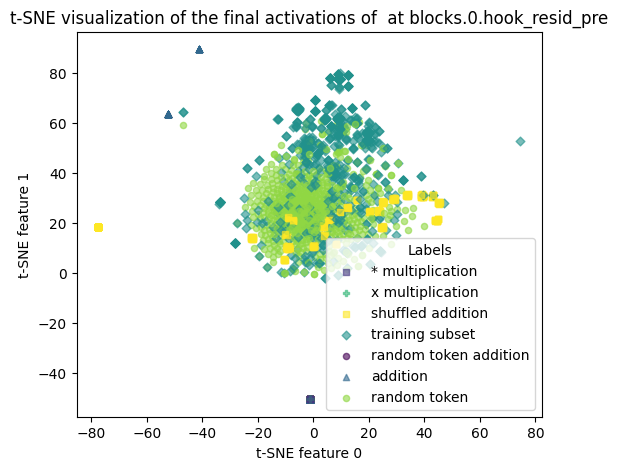

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.0.hook_resid_pre',
  dimension = 2
)

<ipython-input-41-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



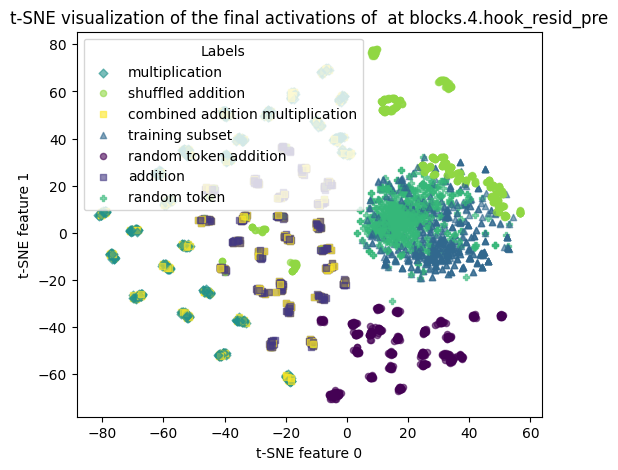

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.4.hook_resid_pre',
  dimension = 2
)

<ipython-input-41-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



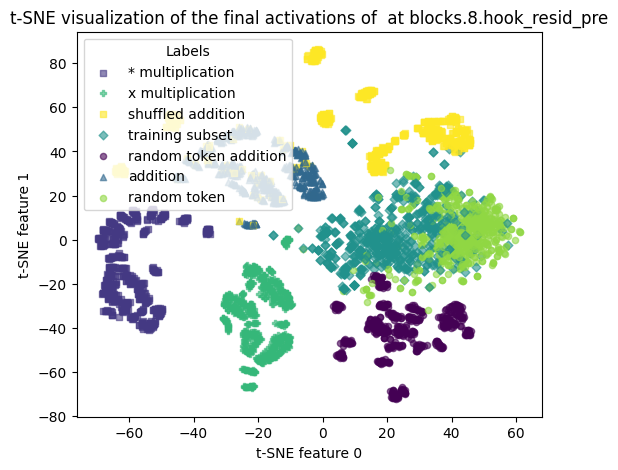

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.8.hook_resid_pre',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = datasets_lang,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



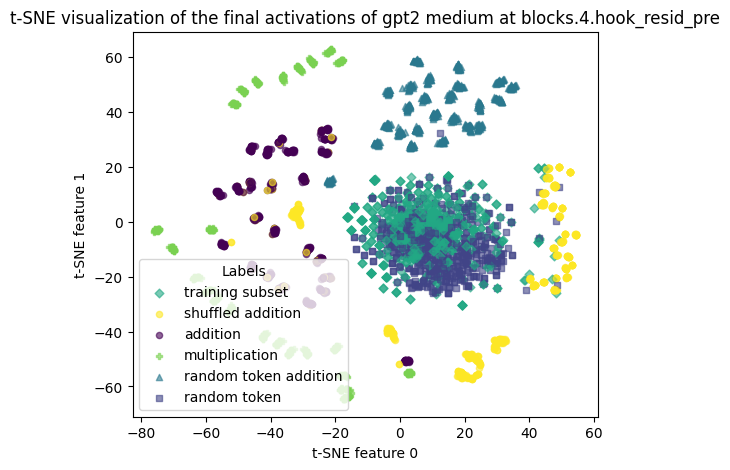

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.4.hook_resid_pre',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



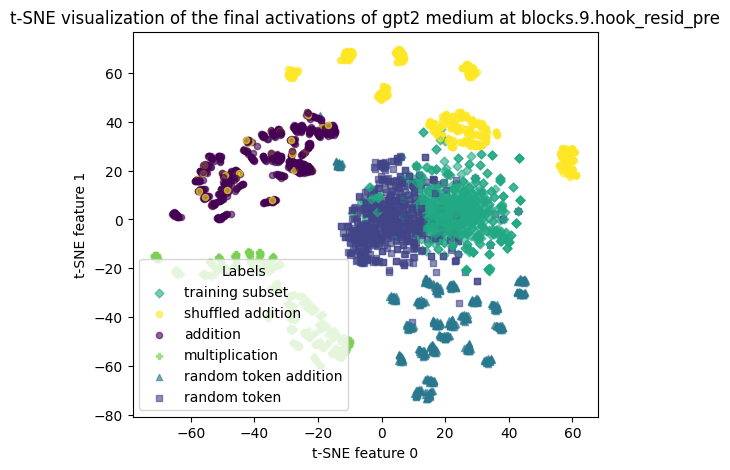

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.9.hook_resid_pre',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



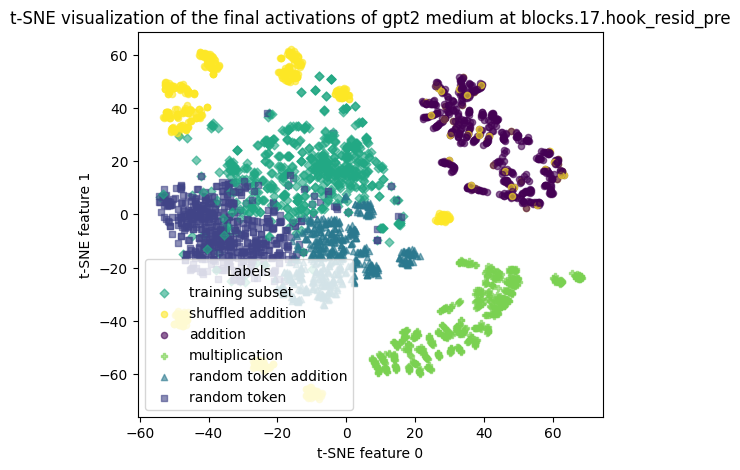

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.17.hook_resid_pre',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



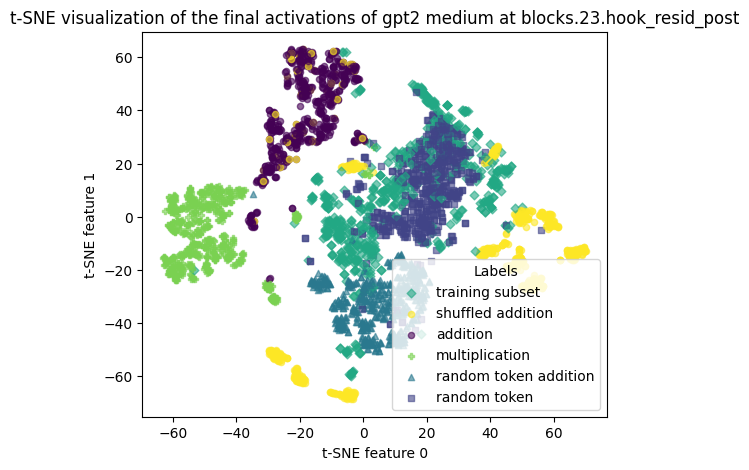

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.23.hook_resid_post',
  dimension = 2
)

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.23.hook_resid_post',
  dimension = 2
)

### GPT-2 large with random points

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



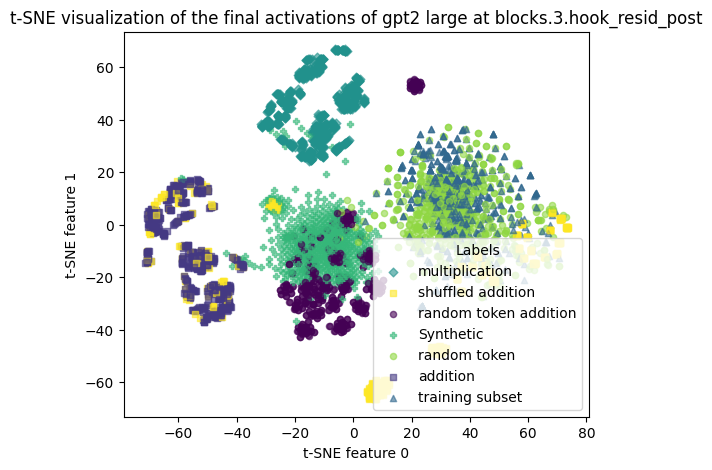

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2,
  random = True,
  centre = True
)

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.24.attn_',
  dimension = 2,
  random = True,
  centre = True
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



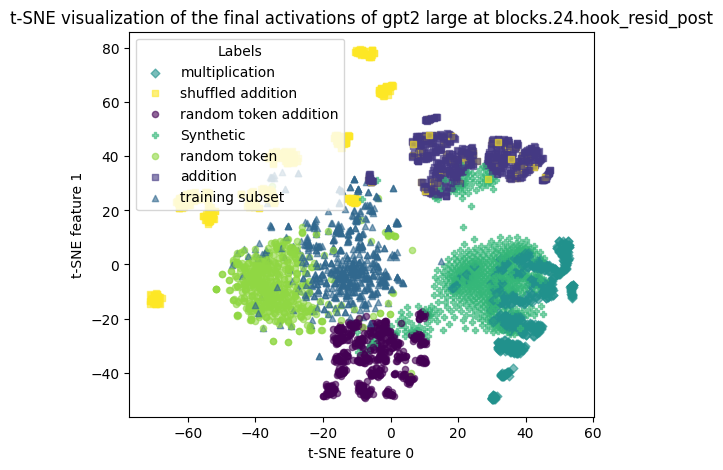

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.24.hook_resid_post',
  dimension = 2,
  random = True,
  centre = True
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



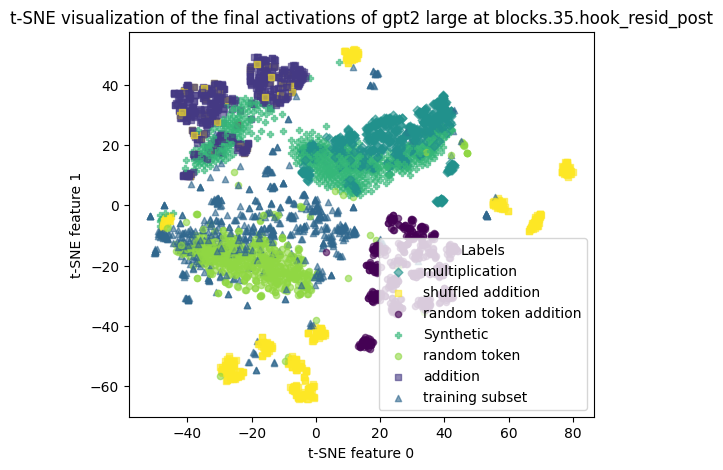

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = datasets_lang2,
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.35.hook_resid_post',
  dimension = 2,
  random = True,
  centre = True
)

## Inter-Dataset Activations (Token)

<ipython-input-129-0fdbd63bd4dd>:62: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



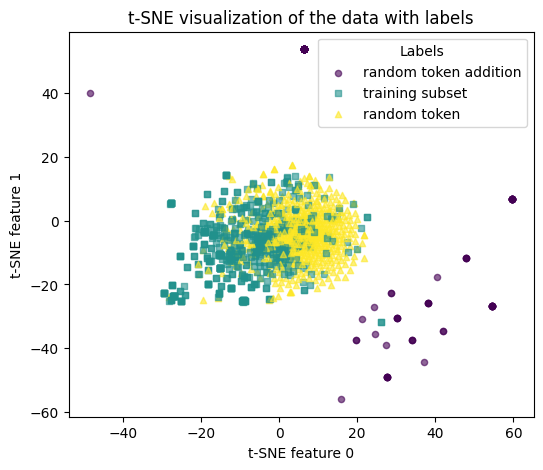

In [ ]:
activation_plot_multiple_datasets(

  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.0.hook_resid_pre',
  dimension = 2
)

<ipython-input-129-0fdbd63bd4dd>:62: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



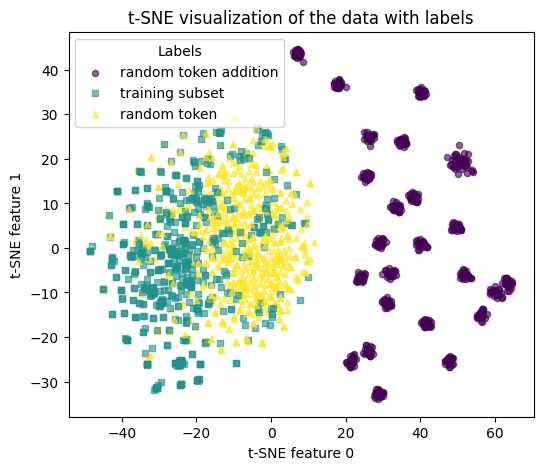

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_pre',
  dimension = 2
)

<ipython-input-129-0fdbd63bd4dd>:62: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



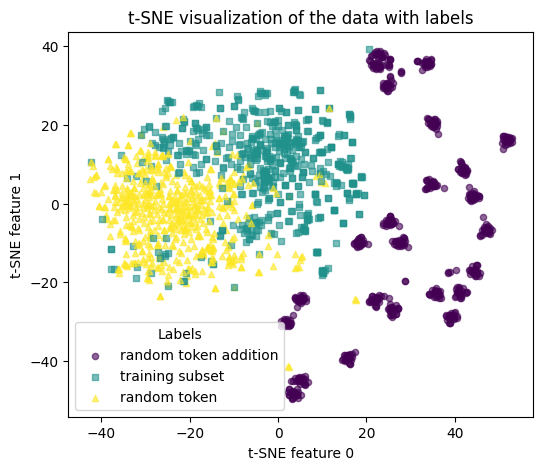

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.6.hook_resid_pre',
  dimension = 2
)

<ipython-input-129-0fdbd63bd4dd>:62: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



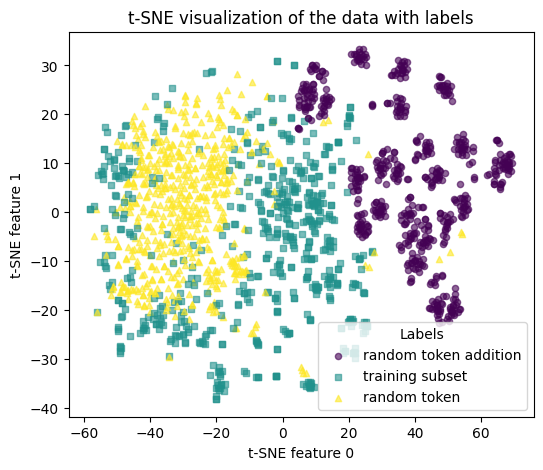

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.9.hook_resid_pre',
  dimension = 2
)

<ipython-input-129-0fdbd63bd4dd>:62: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



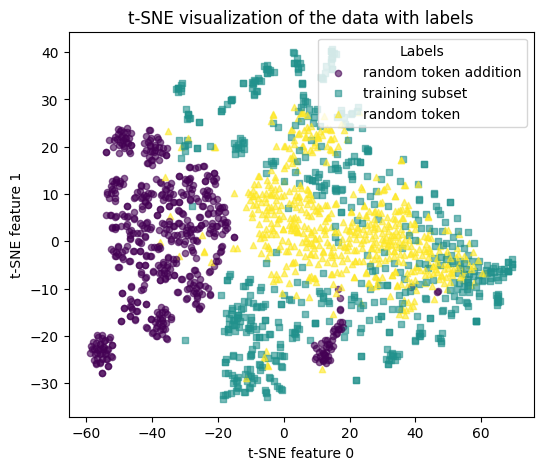

In [ ]:
activation_plot_multiple_datasets(
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



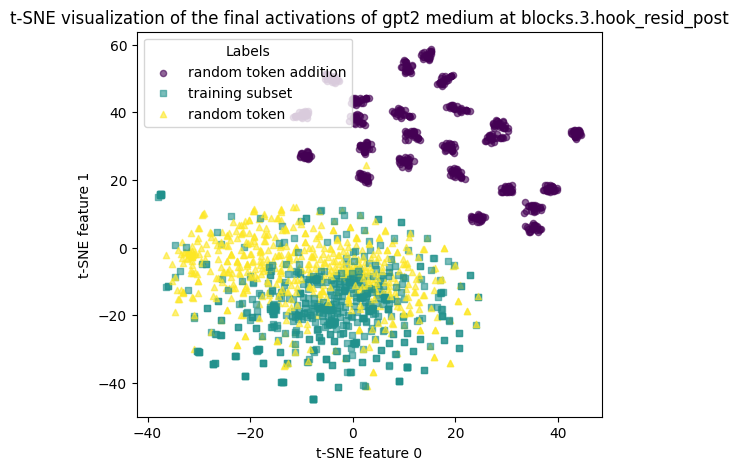

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



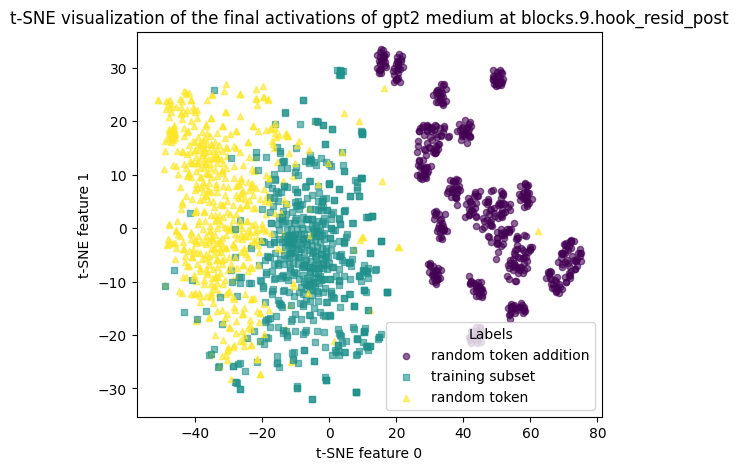

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.9.hook_resid_post',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



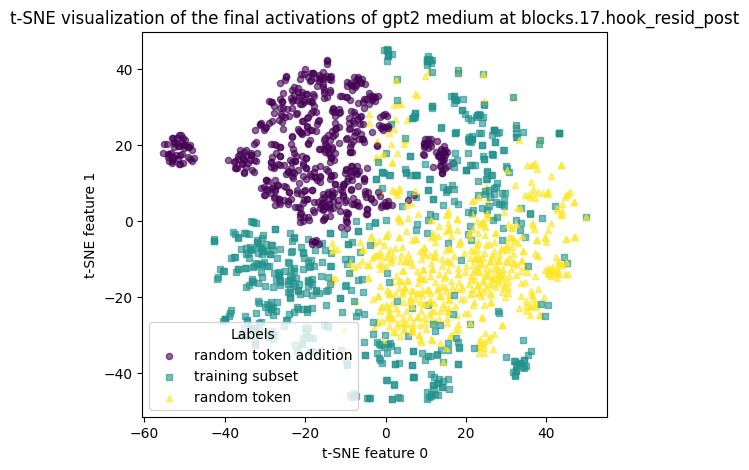

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.17.hook_resid_post',
  dimension = 2
)

<ipython-input-78-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



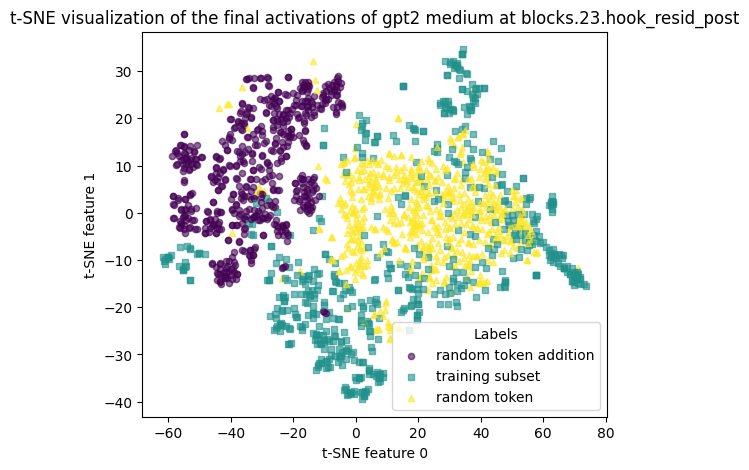

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_medium,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.23.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



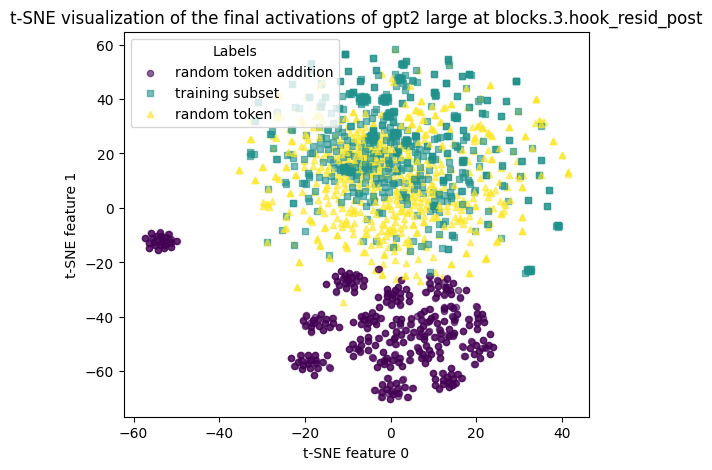

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



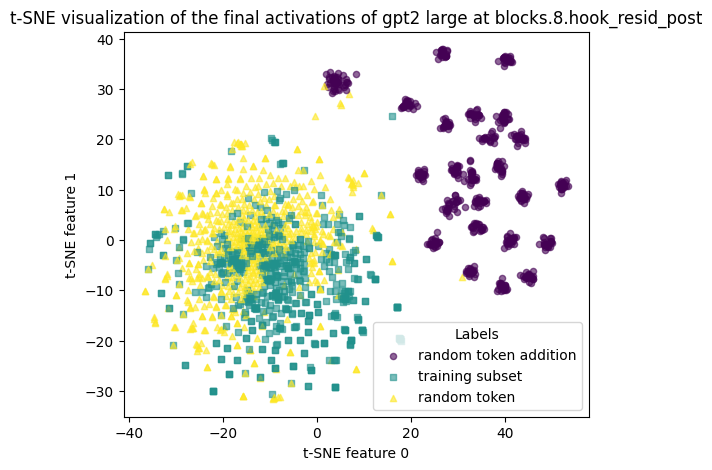

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.8.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



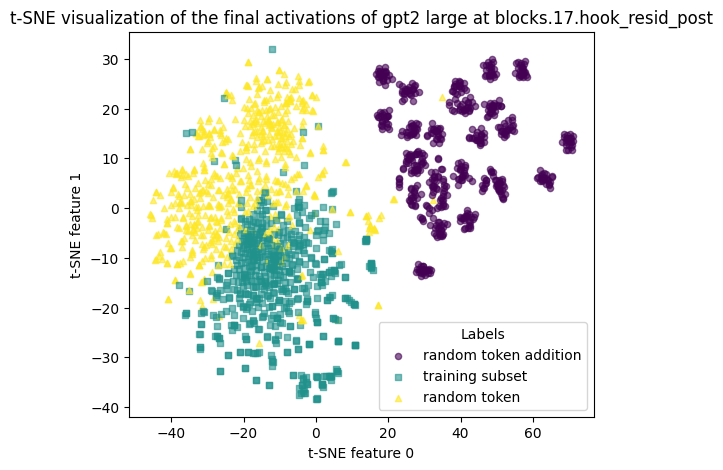

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.17.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



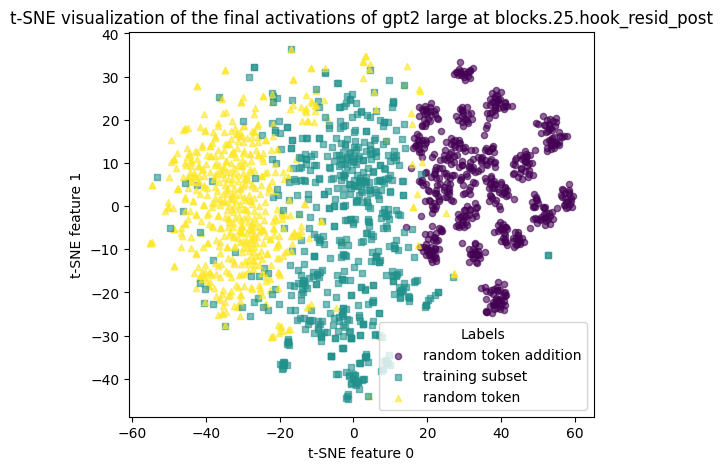

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.25.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



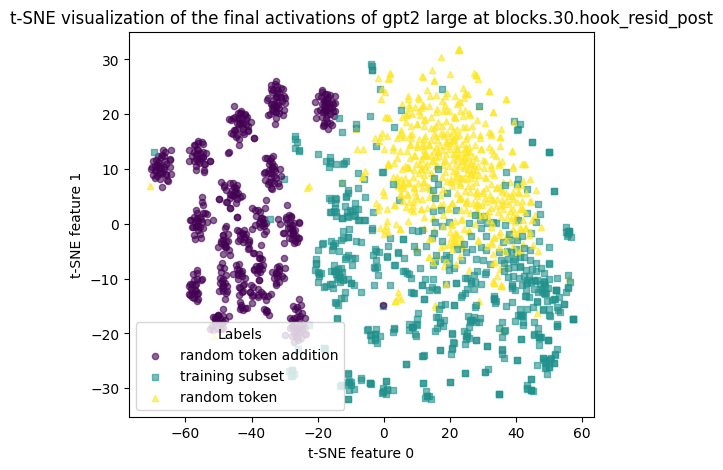

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.30.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



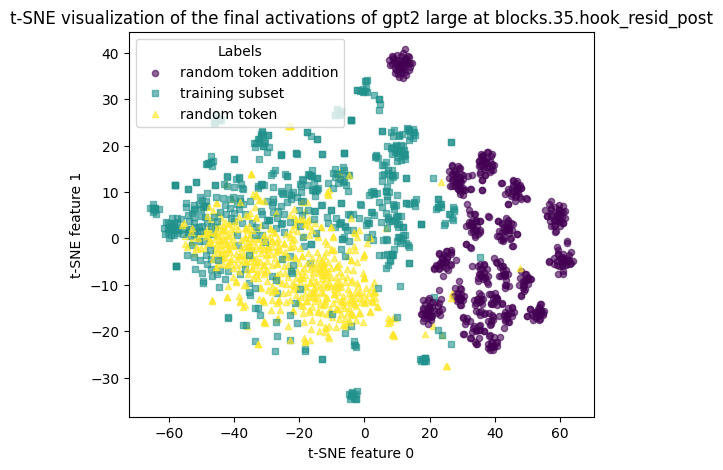

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.35.hook_resid_post',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



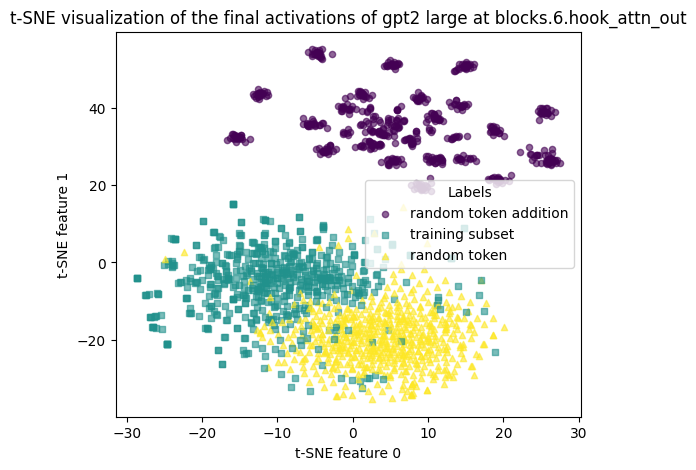

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.6.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



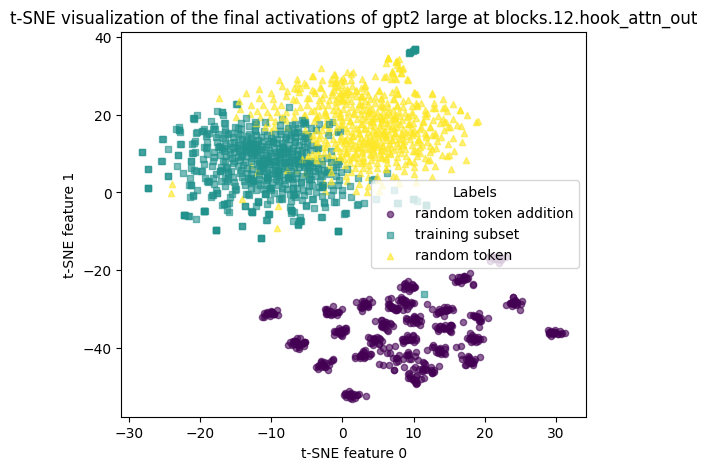

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.12.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



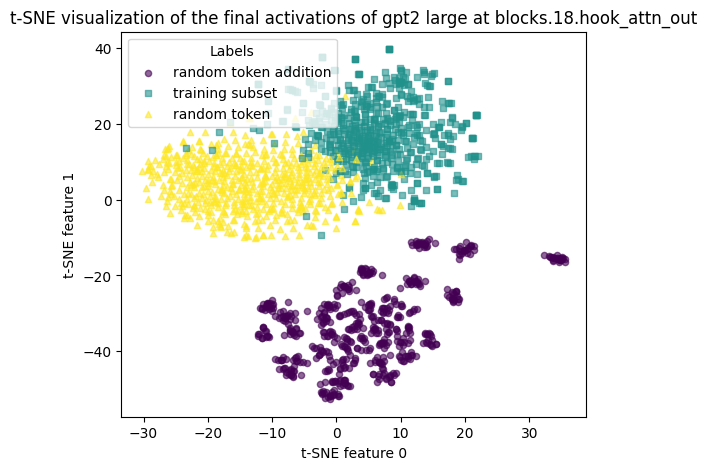

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.18.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



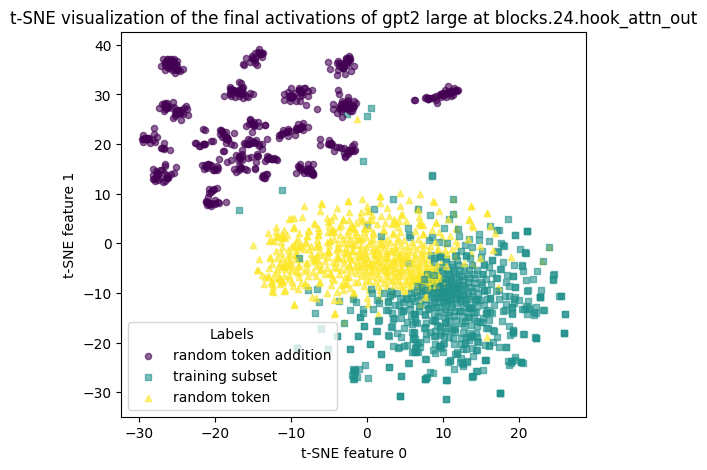

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.24.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



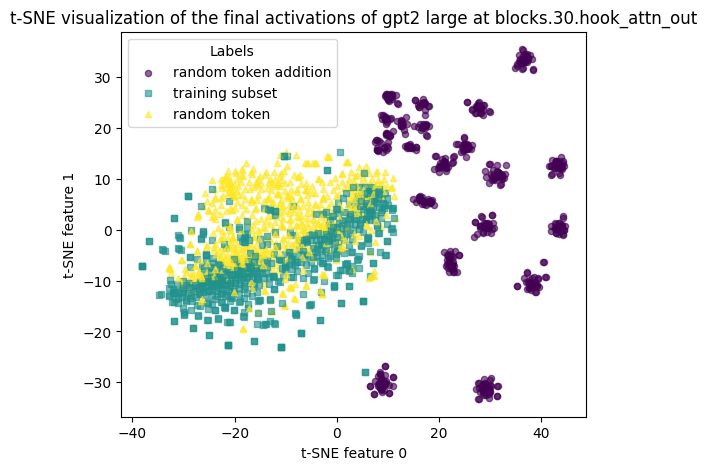

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.30.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



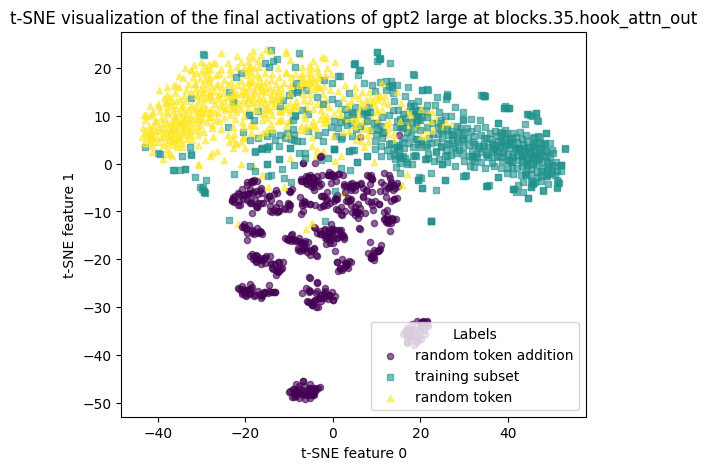

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.35.hook_attn_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



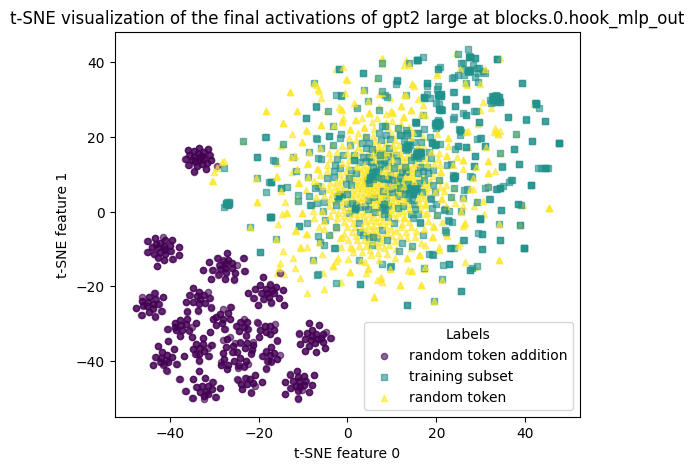

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.0.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



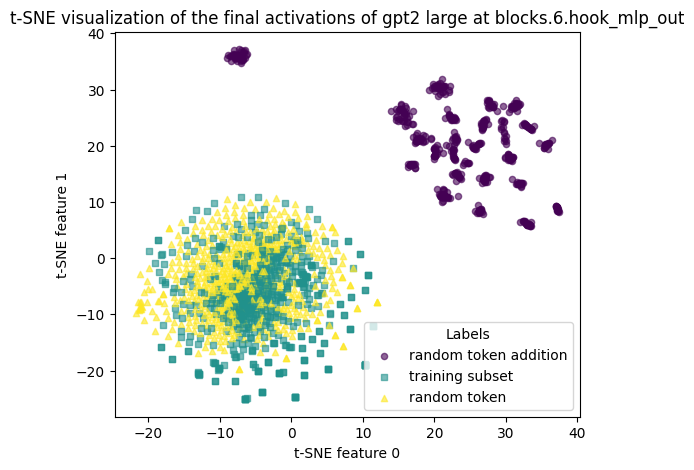

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.6.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



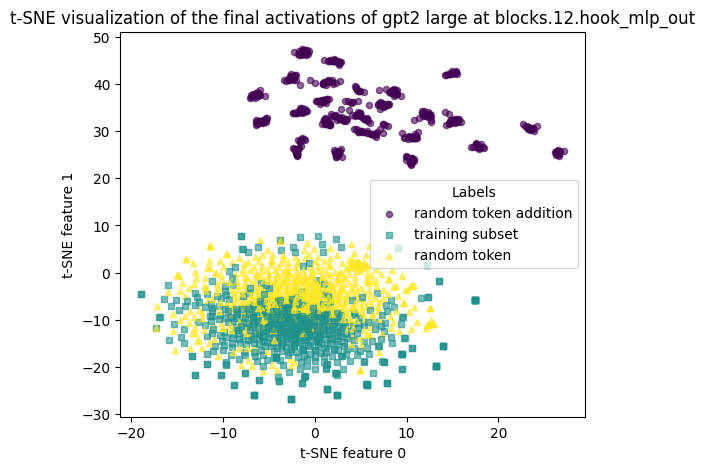

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.12.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



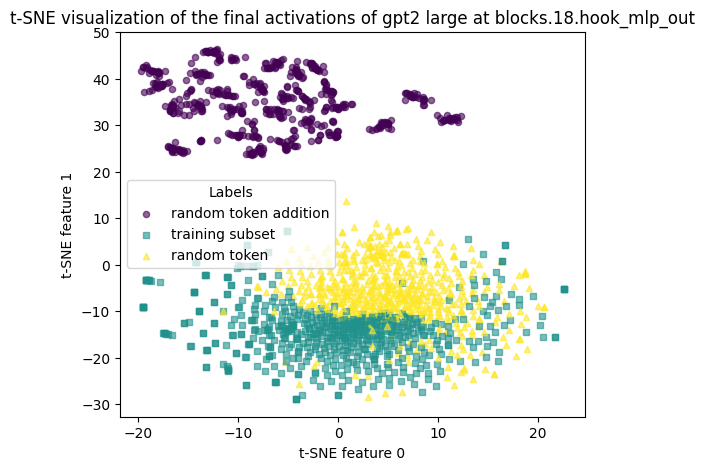

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.18.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



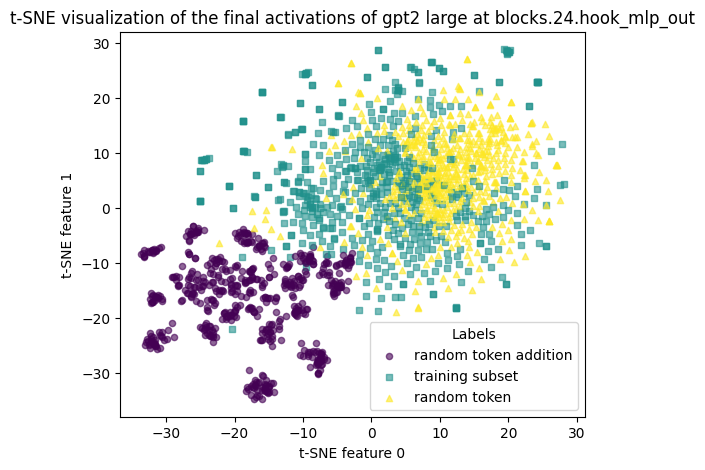

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.24.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



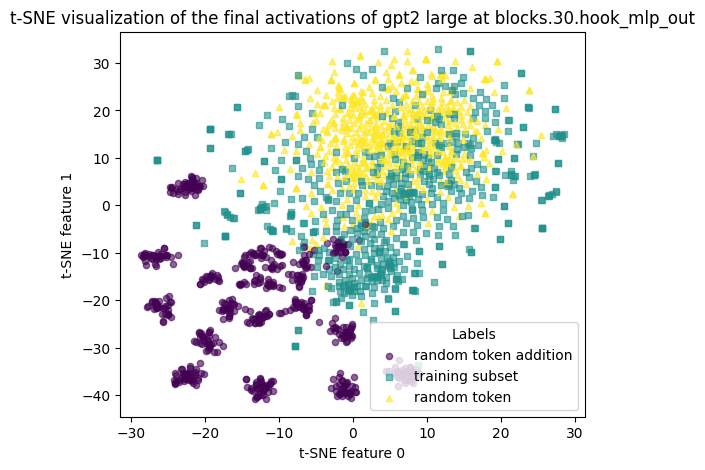

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.30.hook_mlp_out',
  dimension = 2
)

<ipython-input-32-f2cf9b21886c>:64: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



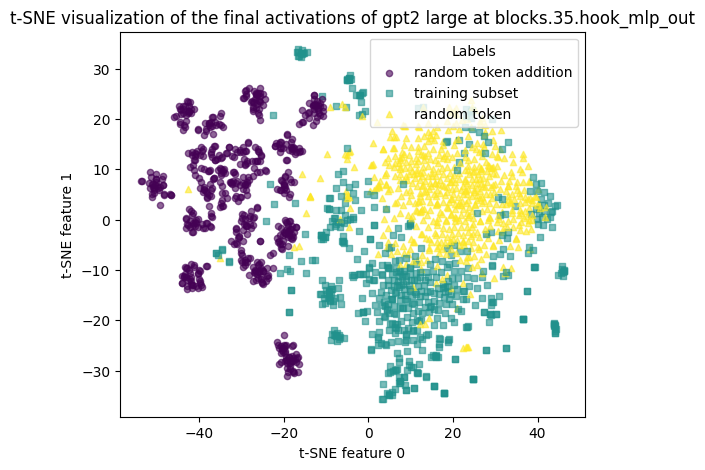

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.35.hook_mlp_out',
  dimension = 2
)

In [ ]:
gpt2_large.blocks

ModuleList(
  (0-35): 36 x TransformerBlock(
    (ln1): LayerNormPre(
      (hook_scale): HookPoint()
      (hook_normalized): HookPoint()
    )
    (ln2): LayerNormPre(
      (hook_scale): HookPoint()
      (hook_normalized): HookPoint()
    )
    (attn): Attention(
      (hook_k): HookPoint()
      (hook_q): HookPoint()
      (hook_v): HookPoint()
      (hook_z): HookPoint()
      (hook_attn_scores): HookPoint()
      (hook_pattern): HookPoint()
      (hook_result): HookPoint()
    )
    (mlp): MLP(
      (hook_pre): HookPoint()
      (hook_post): HookPoint()
    )
    (hook_q_input): HookPoint()
    (hook_k_input): HookPoint()
    (hook_v_input): HookPoint()
    (hook_attn_out): HookPoint()
    (hook_mlp_out): HookPoint()
    (hook_resid_pre): HookPoint()
    (hook_resid_mid): HookPoint()
    (hook_resid_post): HookPoint()
  )
)

In [ ]:
dir(gpt2_large)

['OV',
 'QK',
 'T_destination',
 'W_E',
 'W_E_pos',
 'W_K',
 'W_O',
 'W_Q',
 'W_U',
 'W_V',
 'W_in',
 'W_out',
 'W_pos',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_backward_pre_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_hooks_with_kwargs',
 '_forward_pre_hooks',
 '_forward_pre_hooks_with_kwargs',
 '_get_backward_hooks',
 '_get_backward_pre_hooks',
 '_get_name',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_post_hooks',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',

### GPT-2 large with random points

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



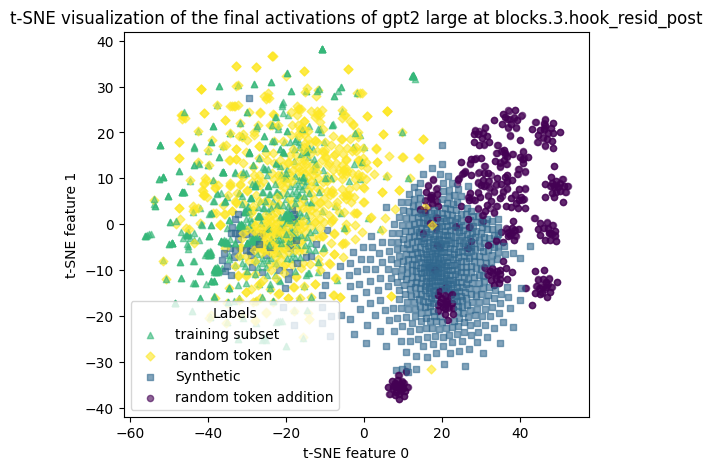

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2,
  random = True,
  centre = True
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



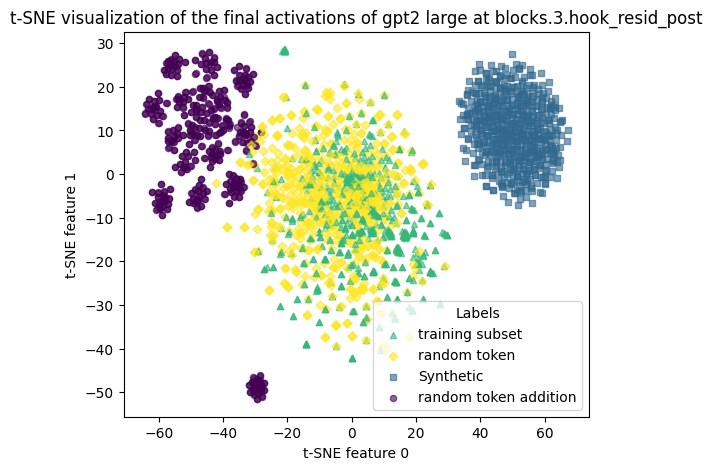

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.3.hook_resid_post',
  dimension = 2,
  random = True,
  centre = False
)

<ipython-input-100-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



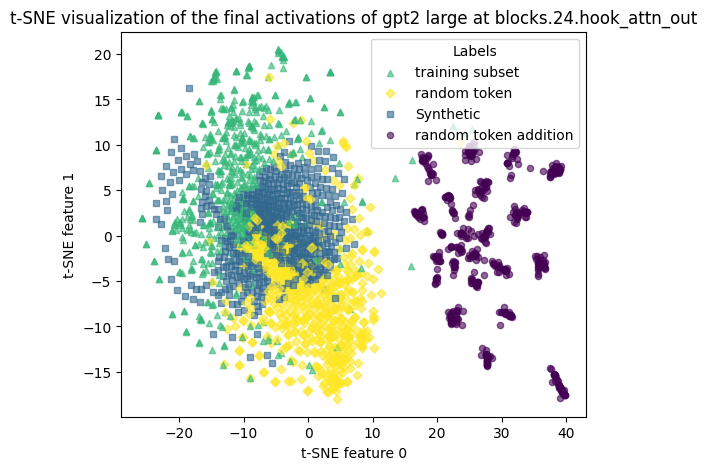

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_large,
  datasets_lang = {},
  datasets_tokens = datasets_tokens,
  plot_type = None,
  location ='blocks.24.hook_attn_out',
  dimension = 2,
  random = True,
  centre = True
)

## Unified Activation Experiments

First improvement: use plotly to be able to display all graphs at once, let us choose between activations, residual streams, and mlp layers; and then slide between different layers of this.

Second improvement: you pass a dictionary of datasets to the experiment, as well as a config dictionary which tells you what kind of processing needs doing with the datasets / what kind of activations we want / how many activations we will look at.

In [ ]:
x = np.linspace(0, np.pi, 1000)

layout = go.Layout(
    title = "SIMPLE EXAMPLE",           # fig.layout.title = "SIMPLE EXAMPLE"
    yaxis = {"title": "volts"},         # fig.layout.yaxis.title = "volts"
    xaxis = {"title": "nanoseconds"},
    width = 500,
    height = 300,
    margin = dict(l=40,r=40,t=60,b=40)
)

@wg.interact
def update_plot(signals = wg.SelectMultiple(options=list(range(6)), value=(0, ), description = "Bessel Order"),
                freq = wg.FloatSlider(min=1, max=20, value=1, desription="Freq")):

    fig = go.Figure(layout = layout)

    for s in signals:

        trace = go.Scatter(
            x = x,
            y = scipy.special.jv(s, freq * x),
            mode = "lines",
            name = f"Bessel {s}",
        )

        fig.add_traces(trace)

    fig.show()

interactive(children=(SelectMultiple(description='Bessel Order', index=(0,), options=(0, 1, 2, 3, 4, 5), value…

In [ ]:
fig = go.FigureWidget(
    layout=go.Layout(
        title_text="y = sin(ax - b)",
        width=500,
        height=300,
        margin=dict(l=20,r=20,t=50,b=20)
    )
)
scatt = fig.add_scatter()

xs=np.linspace(0, 6, 100)

@wg.interact(a=(1.0, 4.0, 0.05), b=(0, 10.0, 0.05), color=['red', 'green', 'blue'])
def update(a=3.6, b=4.3, color='blue'):
    ys = np.sin(a*xs - b)
    with fig.batch_update():
        fig.data[0].x = xs
        fig.data[0].y = ys
        fig.data[0].line.color = color
    fig.show(renderer="colab")

interactive(children=(FloatSlider(value=3.6, description='a', max=4.0, min=1.0, step=0.05), FloatSlider(value=…

## Training vs Random Experiments

I have a few concerns about the above setup. Chief amongst these is what activations are being used. There are two potential issues here I think:

1. We are looking at all activations, not just the final one. This might lead to a lot of correlated activations, which could impact our results.
2. We are only considering activations from inputs which are 5 tokens long. This might be too short for the model to properly distinguish between noise and a meaningful sentence.
3. Might the difference between random and training datasets come further apart for larger datasets?

# Natural Language Experiments

I think I'm going to just randomly sample theactivations of each sentence

## Language Datasets

In [ ]:
# Open from google drive
!ls

Dataset_Processing.ipynb  urlsf_subset01-182_data  Webtext-Data
language_text.json	  urlsf_subset01-1_data
LLM-Entropy.ipynb	  urlsf_subset01.tar


In [ ]:
with open('language_text.json', 'r') as file:
  language_data_dict  = json.load(file)

In [ ]:
language_data_dict_smol = {key: value[:40] for key, value in language_data_dict.items()}
language_data_dict_smol2 = {key: value[40:75] for key, value in language_data_dict.items()}

In [ ]:
language_data_dict_bigger = {key: value[:80] for key, value in language_data_dict.items()}

### Looking at final activations

In [ ]:
t.cuda.empty_cache()

<ipython-input-15-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



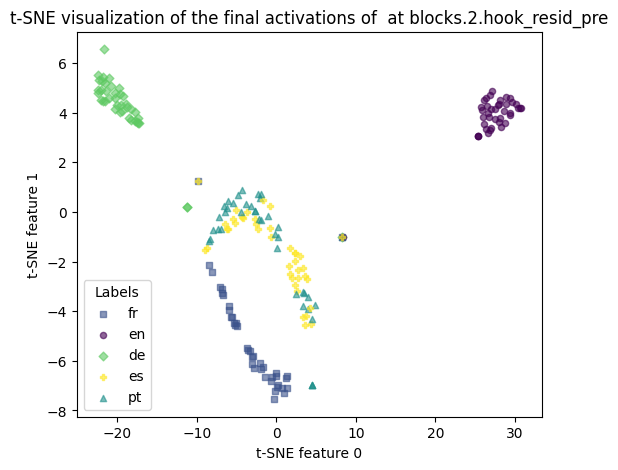

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_smol,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.2.hook_resid_pre',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



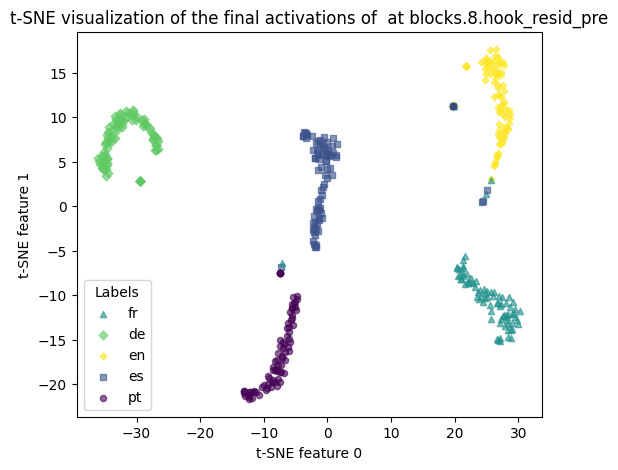

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.8.hook_resid_pre',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



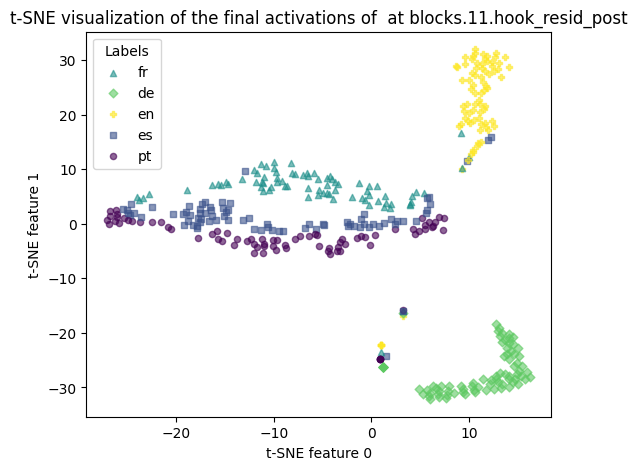

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_resid_post',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



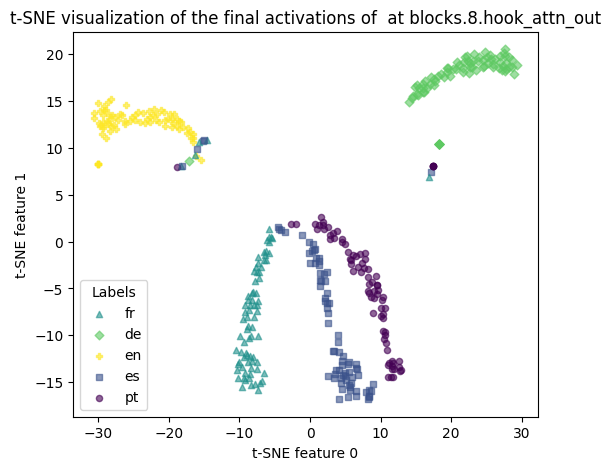

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.8.hook_attn_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



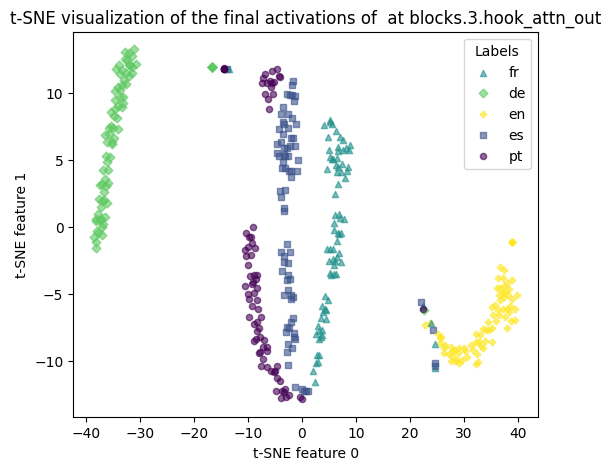

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.3.hook_attn_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



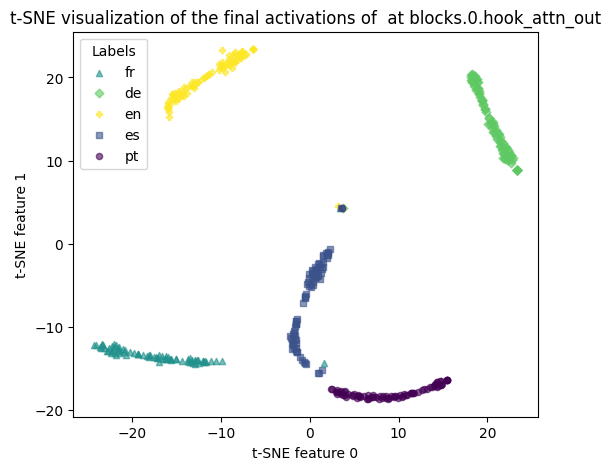

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.0.hook_attn_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



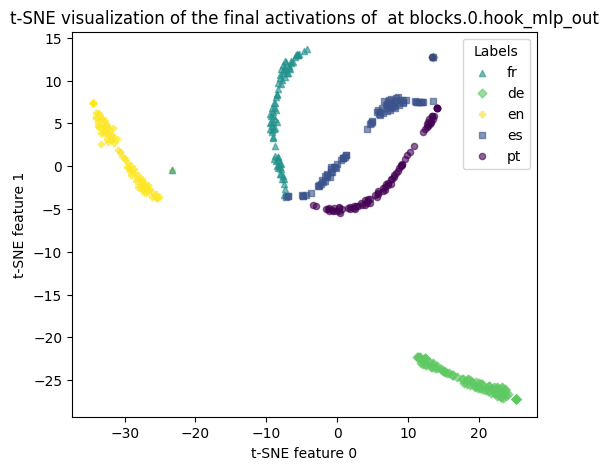

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.0.hook_mlp_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



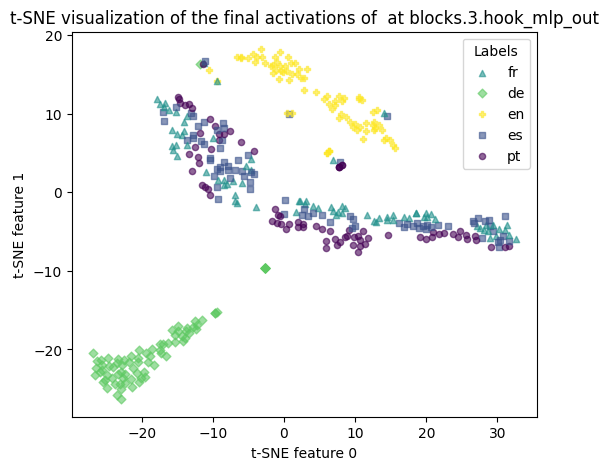

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.3.hook_mlp_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



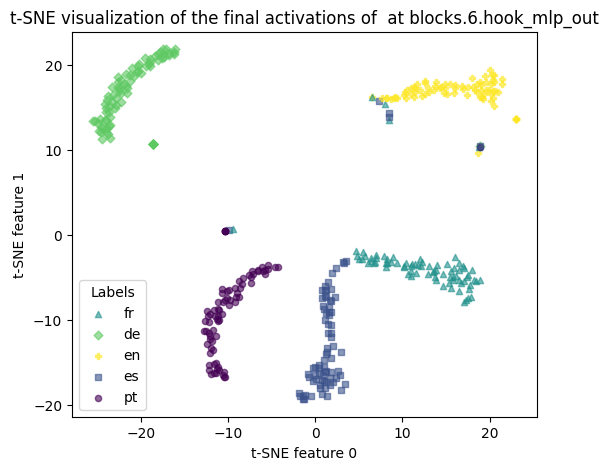

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.6.hook_mlp_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



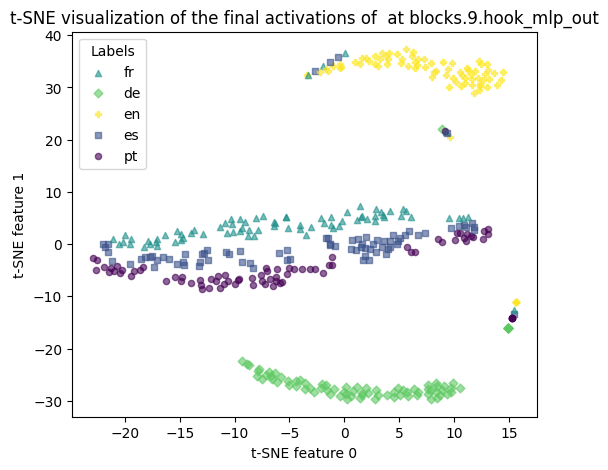

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.9.hook_mlp_out',
  dimension = 2
)

<ipython-input-12-1c8c27a7dd96>:88: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



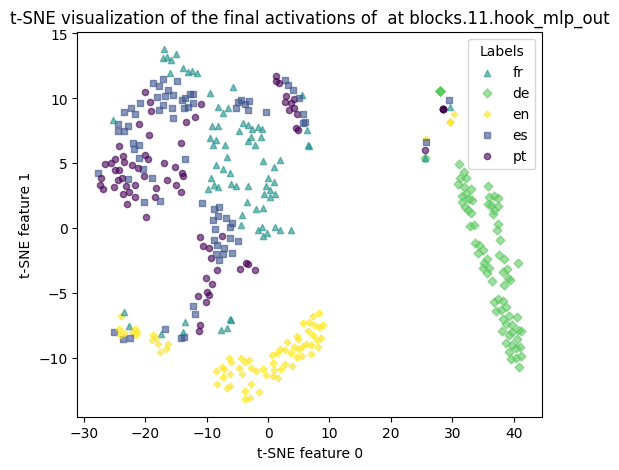

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_small,
  datasets_lang = language_data_dict_bigger,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_mlp_out',
  dimension = 2
)

# Causal Family Experiments

In [ ]:
family_datasets

In [ ]:
activation_plot_multiple_datasets(
  model = gpt2_xl,
  datasets_lang = family_datasets,
  datasets_tokens = {},
  plot_type = None,
  location ='blocks.11.hook_mlp_out',
  dimension = 2
)

OutOfMemoryError: ignored